# Used packages

In [1]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Data preprocesing and visualization

## Load Excel file. Normalize distance, define bins and calculates the average expression within each bin

In [2]:
# Load the Excel file
xls = pd.ExcelFile('quantifications_all-n.xlsx')

# Dictionary to hold DataFrames, keys are sheet names
dfs = {}

# Define the bins and labels
bin_edges = np.arange(-2.5, 105.5, 5)
bin_labels = np.arange(0,105,5)

# Iterate through each sheet
for sheet_name in xls.sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet_name, header=[0, 1])

    # Prepare a new DataFrame to hold adjusted distances and expressions
    new_df = pd.DataFrame()

    # Process each pair of 'Distance' and corresponding expression
    for i in range(0, df.shape[1], 2):
        distance_col = df.iloc[:, i]
        expression_col = df.iloc[:, i + 1]
        pair_index = i // 2 + 1

        # Normalize the 'Distance' to range from 0 to 100
        relative_distance = (distance_col / distance_col.max()) * 100

        # Bin the normalized distances using pd.cut
        binned_distances = pd.cut(relative_distance, bins=bin_edges, labels=bin_labels, right=True, include_lowest=True)

        # Combine binned distances with expressions
        combined_data = pd.DataFrame({'BinnedDistance': binned_distances, 'Expression': expression_col}).dropna()

        # Group by the binned distance and calculate mean expression per bin
        binned_data = combined_data.groupby('BinnedDistance', observed=True).mean().reset_index()

        # Add the binned data to the new DataFrame
        new_df[f'Distance_{pair_index}'] = binned_data['BinnedDistance']
        new_df[f'Expression_{pair_index}'] = binned_data['Expression']

    # Store the binned DataFrame in the dictionary with the sheet name as key
    dfs[sheet_name] = new_df

## Categorizing the data by gene and condition

In [3]:
# Initialize dictionaries for both detailed and aggregated data
replica_data_dict = {}
gene_stats = {}

# Loop through each entry in the dfs dictionary
for key, df in dfs.items():
    
    # Extract gene name and condition from the key
    parts = key.split()
    gene = ' '.join(parts[1:-1])
    condition = parts[-1]

    # Prepare sub-dictionaries for gene and condition if not already present
    if gene not in replica_data_dict:
        replica_data_dict[gene] = {}
    if gene not in gene_stats:
        gene_stats[gene] = {}

    # Prepare DataFrame to collect all distances and expressions for detailed data
    combined_df = pd.DataFrame()

    # Number of replicas is half of the columns because each has a Distance_i and Expression_i pair
    num_replicas = len(df.columns) // 2
    for i in range(1, num_replicas + 1):
        distance_col = f'Distance_{i}'
        expression_col = f'Expression_{i}'

        # Collect each replica's data
        replica_data = df[[distance_col, expression_col]].dropna()
        replica_data.columns = ['Distance', f'{i}']  # Rename expression columns to replica numbers

        # Combine the current replica's data into the combined DataFrame
        if combined_df.empty:
            combined_df = replica_data
        else:
            combined_df = pd.merge(combined_df, replica_data, on='Distance', how='outer')

    # Sort by Distance to maintain order
    combined_df = combined_df.sort_values(by='Distance').reset_index(drop=True)

    # Store the combined DataFrame in the replica_data_dict under the appropriate gene and condition
    replica_data_dict[gene][condition] = combined_df

    # Calculate statistics: mean, std, and sem for gene_stats
    melted_df = combined_df.melt(id_vars='Distance', var_name='Replica', value_name='Expression')
    stats_df = melted_df.groupby('Distance', observed=False)['Expression'].agg(['mean', 'std', 'sem']).reset_index()

    # Store the resulting DataFrame in the gene_stats dictionary under the appropriate gene and condition
    gene_stats[gene][condition] = stats_df

# Define the order of genes manually
gene_order = ['Shh', 'Nkx6.1', 'Pax6', 'Pax7', 'Msx1', 'Sox2']

# Sorting the gene_stats dictionary according to gene_order
sorted_gene_stats = {gene: gene_stats[gene] for gene in gene_order if gene in gene_stats}
sorted_replica_data_dict = {gene: replica_data_dict[gene] for gene in gene_order if gene in replica_data_dict}

In [4]:
sorted_replica_data_dict['Shh']['homeostatic'].head()

,Distance,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,0,229.503846,188.455167,140.256400,140.616727,177.324250,138.661857,122.960333,163.023400,224.172700,...,326.369909,132.28230,321.421417,174.699231,116.030583,164.799182,192.596636,160.795833,119.215846,124.131357
1,5,187.528500,188.382773,183.060850,124.196636,143.054318,122.232280,79.009955,177.849000,105.701526,...,193.787381,135.57010,302.596478,125.672077,109.203818,140.800091,119.569300,115.412609,139.984808,96.682000
2,10,112.813320,152.314182,228.202000,99.160955,112.283043,101.285778,85.267478,167.359947,138.838421,...,190.397048,223.36585,243.212565,114.091846,114.191957,84.403591,91.289700,75.292333,96.513160,91.806481
3,15,117.863250,81.030652,210.192150,73.014909,96.675182,83.623654,76.606773,106.821450,108.667700,...,68.104619,123.69490,78.158478,101.997760,109.001409,121.963095,88.782050,109.365304,100.734320,107.175654
4,20,103.459680,116.856455,229.233158,90.516591,91.074435,92.132192,70.525348,59.041053,109.998316,...,79.706857,149.22205,72.665957,101.839615,66.600000,100.747500,77.515600,72.481043,67.986308,64.626815


In [5]:
sorted_gene_stats['Shh']['homeostatic'].head()

,Distance,mean,std,sem
0,0,171.751485,59.788404,12.746931
1,5,146.350962,48.805557,10.405380
2,10,130.402631,49.725901,10.601598
3,15,102.878286,30.467479,6.495688
4,20,92.815590,37.275256,7.947111


## Data visualization

In [6]:
plt.rcParams.update({
    'font.family': ['serif'],
    'font.sans-serif': ['arial'],
    'font.size': 5,
    'axes.labelsize': 5,
    'axes.titlesize': 5,
    'xtick.labelsize': 5,
    'ytick.labelsize': 5,
    'legend.fontsize': 5
})

In [7]:
# Define colors for each condition for consistency in the plot
colors = {'homeostatic': 'dimgray', 
          'blastema': 'green'}
zorder = {'homeostatic': 1, 
          'blastema': 0}

In [8]:
# Function to set custom x-tick labels for inverted labels
def set_inverted_xticks(ax):
    ax.set_xticks([0, 20, 40, 60, 80, 100])
    inverted_labels = [str(100 - tick) for tick in [0, 20, 40, 60, 80, 100]]
    ax.set_xticklabels(inverted_labels)

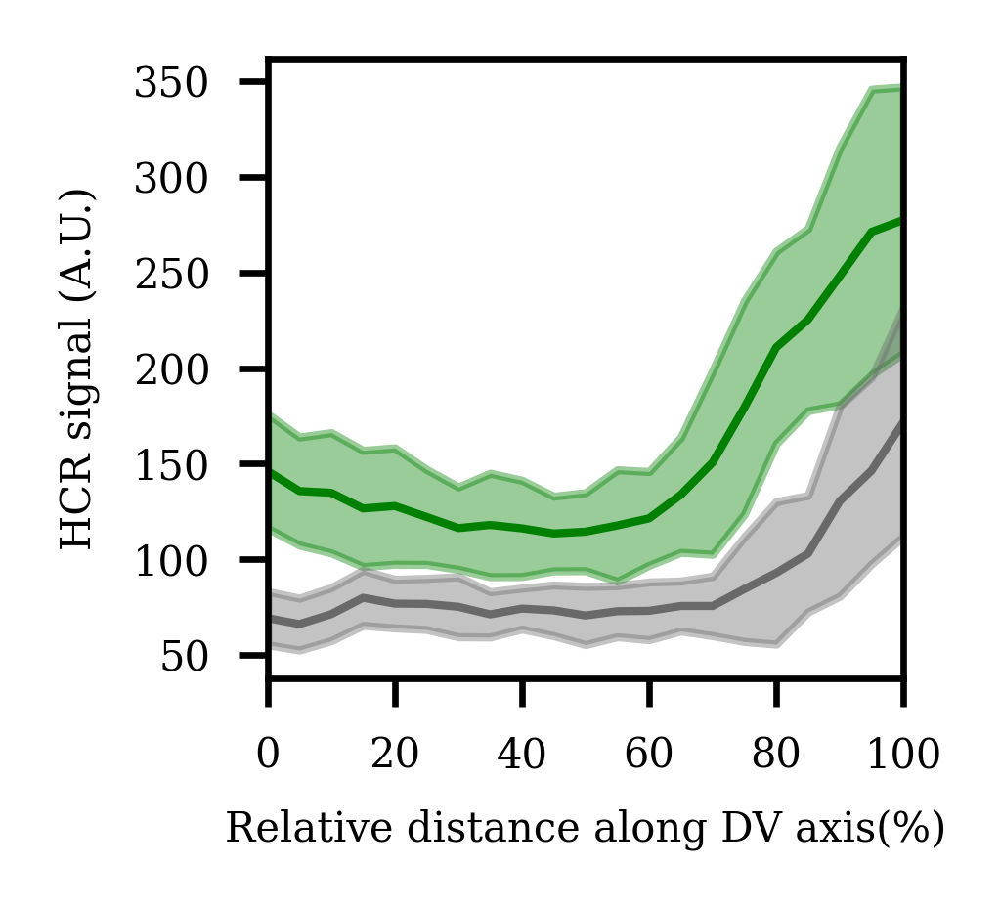

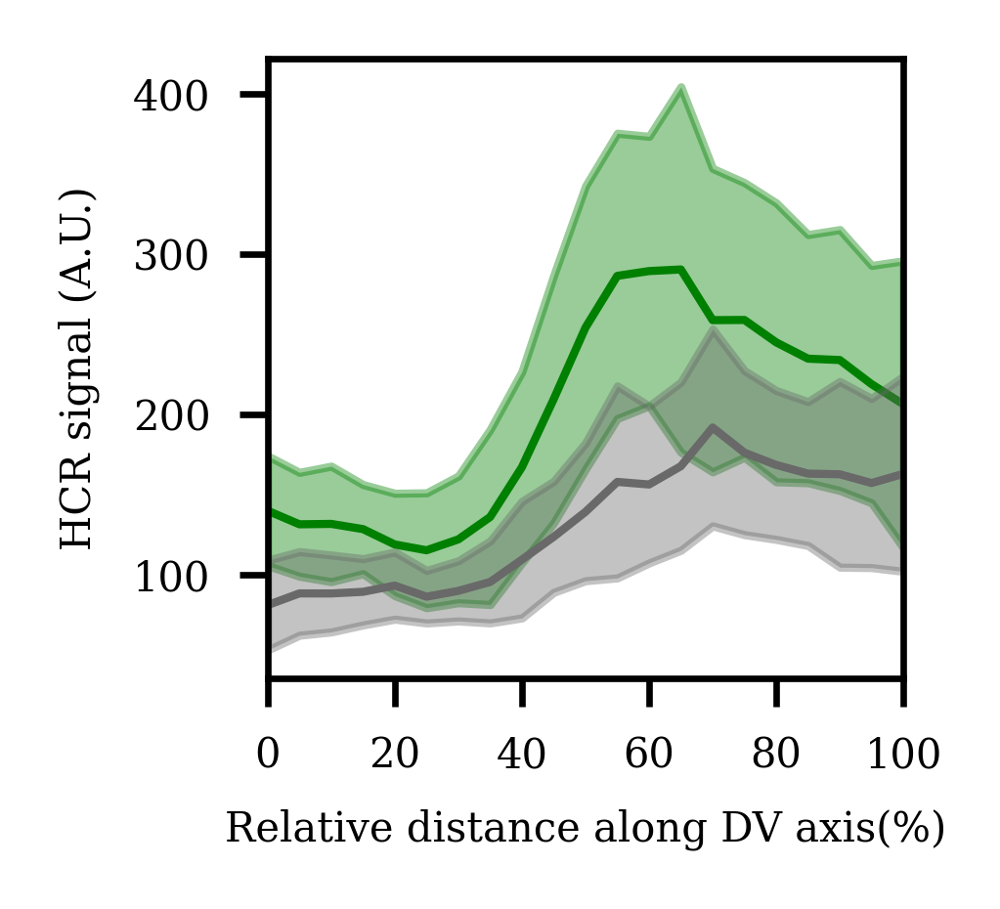

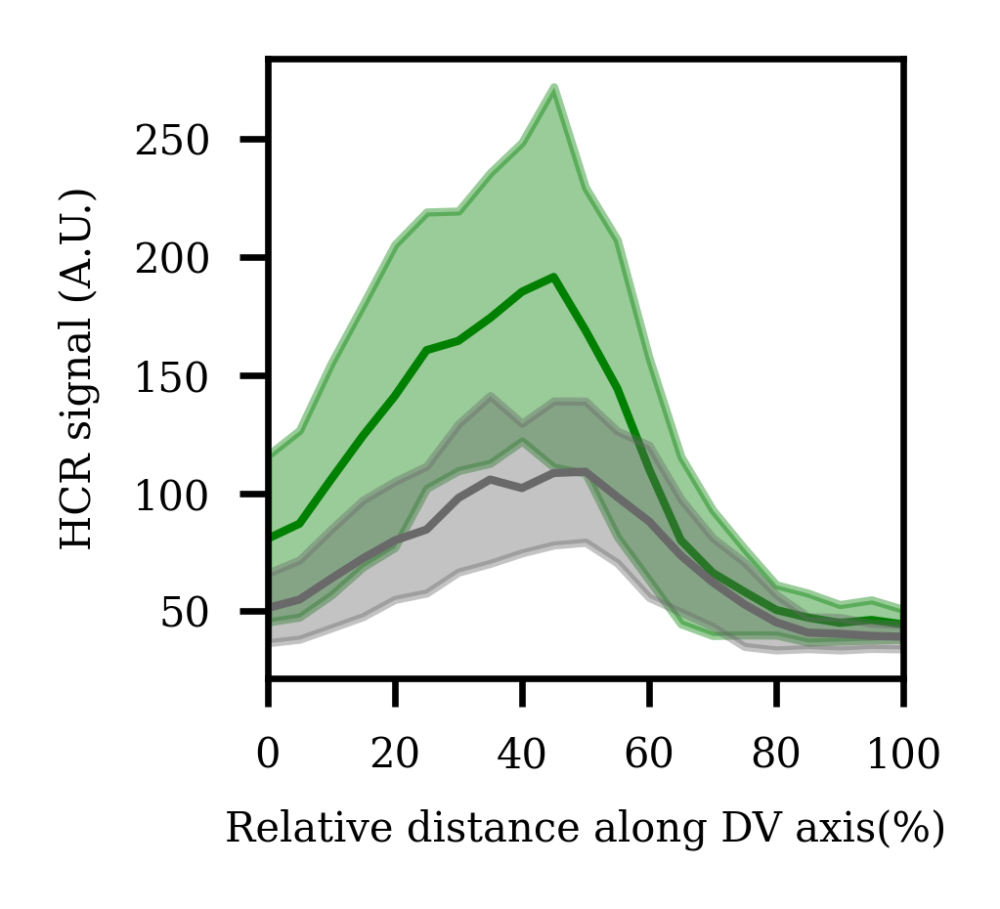

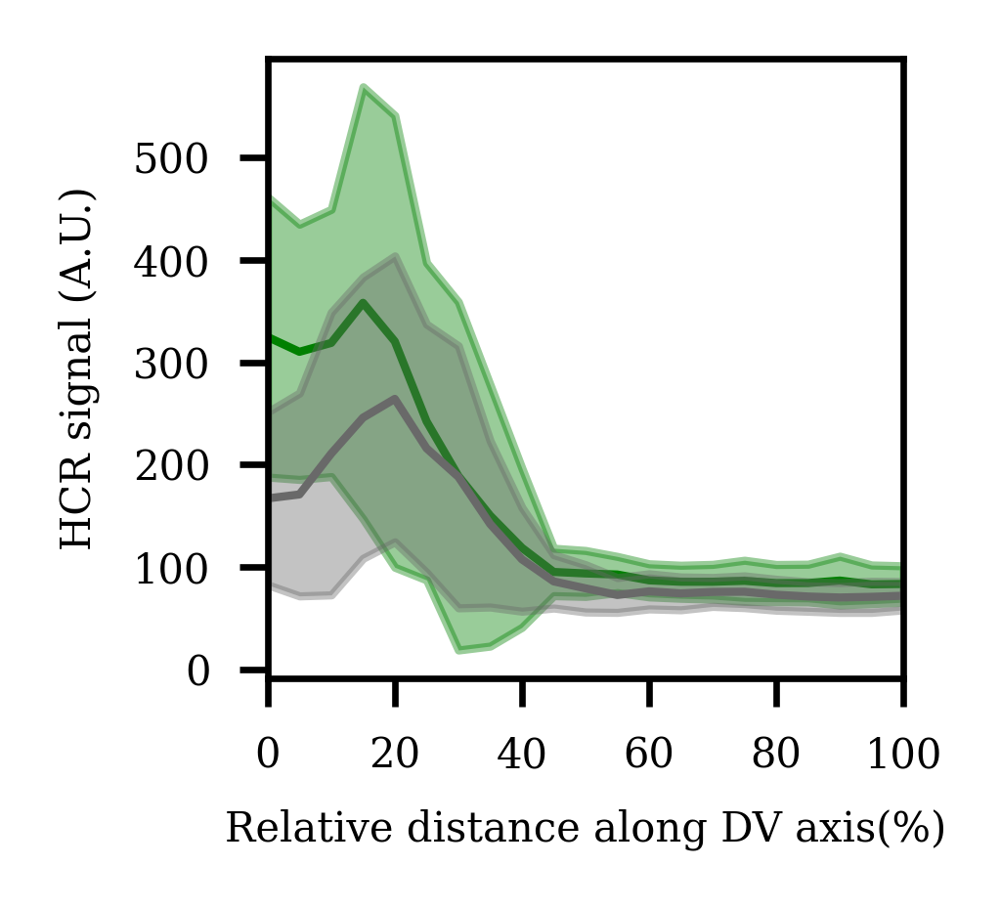

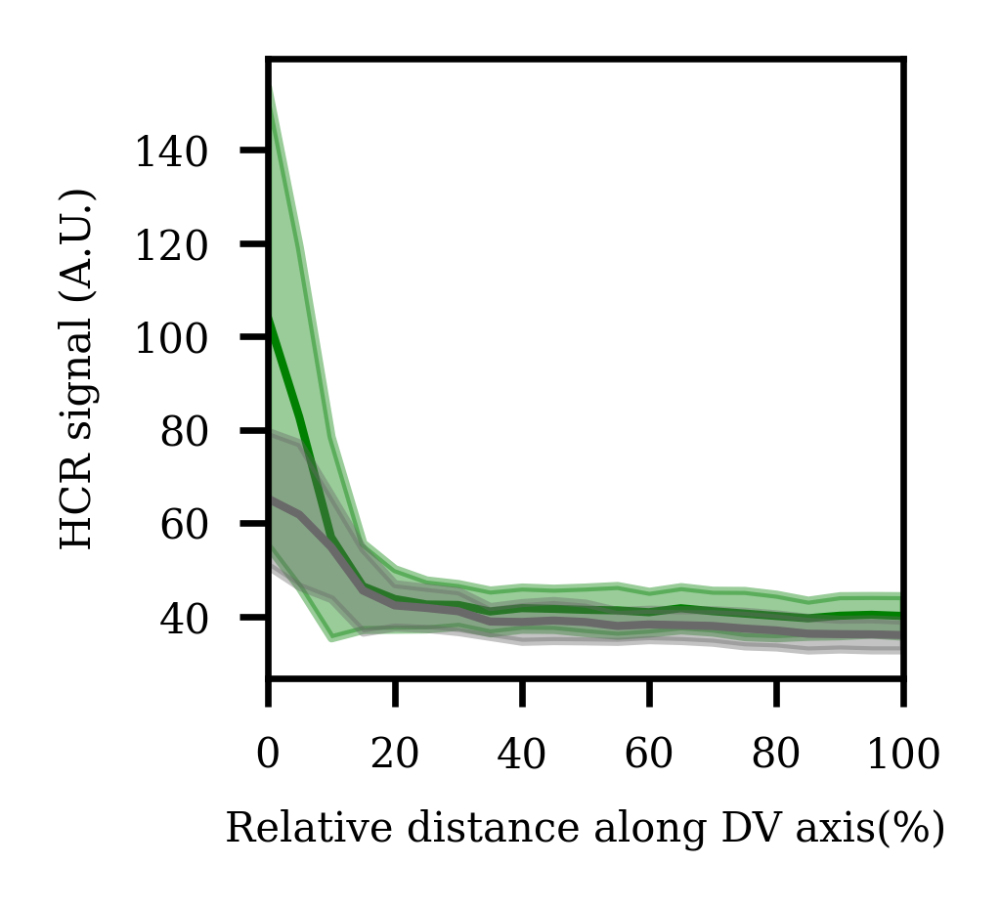

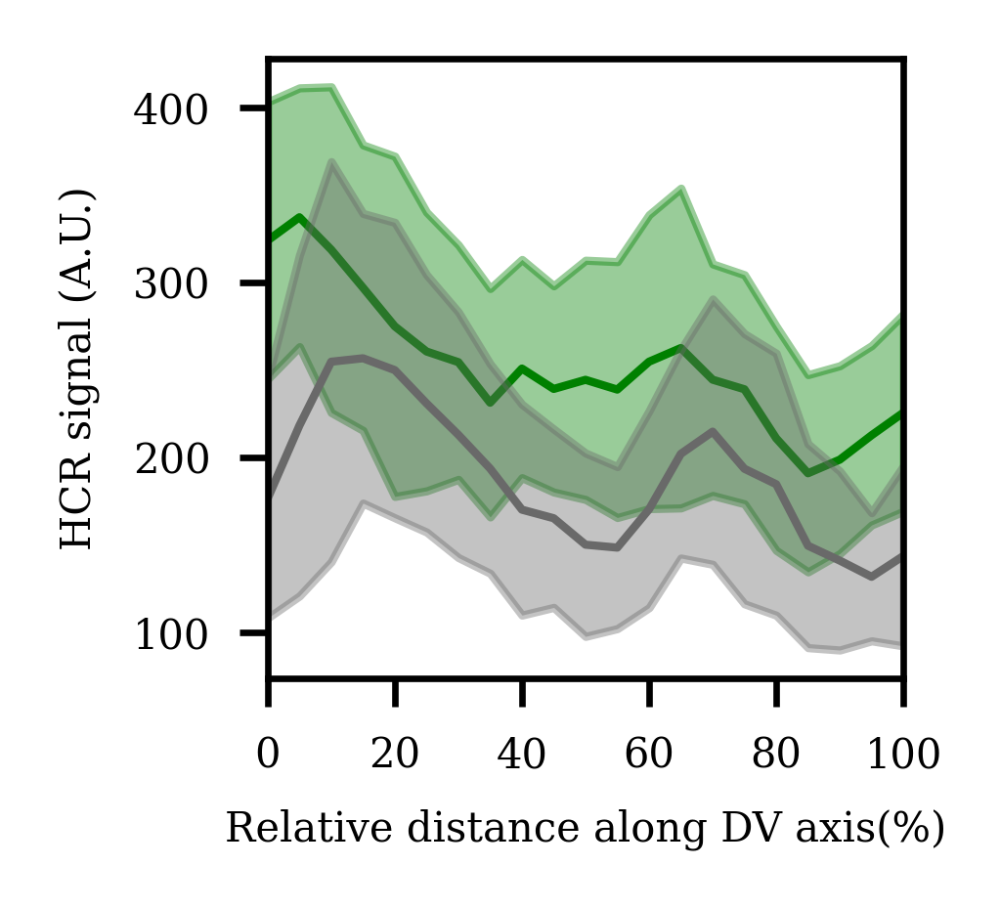

In [9]:
# Loop through each gene in the replica_data_dict
for gene, conditions in sorted_replica_data_dict.items():
    plt.figure(figsize=(1.6, 1.5), dpi=600)
    # plt.title(f"Expression Profiles for {gene} - {condition}")
    plt.xlabel("Relative distance along DV axis(%)")
    plt.ylabel("HCR signal (A.U.)")
    for condition, df in conditions.items():

        # Plot each replica data
        num_replicas = (len(df.columns) - 1)  # Exclude the 'Distance' column
        for i in range(1, num_replicas + 1):
            if f'{i}' in df.columns:
                #plt.plot(df['Distance'], df[f'{i}'], label=f'replica {i}', alpha=0.1, color=colors[condition], linewidth=1, linestyle='--', zorder=zorder[condition])
                continue
                
        # Retrieve mean, std from gene_stats and plot them
        if gene in gene_stats and condition in gene_stats[gene]:
            stats_df = gene_stats[gene][condition]
            plt.plot(stats_df['Distance'], stats_df['mean'], color=colors[condition], label='mean', linewidth=1, zorder=zorder[condition])
            # plt.plot(stats_df['Distance'], stats_df['mean'] - stats_df['std'], 'k-', linewidth=1, alpha=0.2)
            # plt.plot(stats_df['Distance'], stats_df['mean'] + stats_df['std'], 'k-', linewidth=1, alpha=0.2)

            plt.fill_between(stats_df['Distance'], stats_df['mean'] - stats_df['std'],
                             stats_df['mean'] + stats_df['std'], color=colors[condition], alpha=0.4, label='std', zorder=zorder[condition])

    # Set axis limits and ticks
    max_mean_index = stats_df['mean'].idxmax()  # Get the index of the maximum mean value
    max_mean_value = stats_df.loc[max_mean_index, 'mean']
    corresponding_std_value = stats_df.loc[max_mean_index, 'std']
    # plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left")
    plt.tight_layout()
    plt.xlim(0,100)
    plt.gca().invert_xaxis()
    ax = plt.gca()
    set_inverted_xticks(ax)  # Set custom inverted x-tick labels
    plt.savefig(f'data/data_{gene}.png', dpi=600, bbox_inches='tight')  # Save the figure for each condition
    plt.show()

# Piecewise constant fitting (three steps)

The three-step piecewise constant function is defined as follows:

$$ f(x) = \begin{cases} 
a & \text{if } x < sp1 \\
b & \text{if } sp1 \leq x < sp2 \\
c & \text{if } x \geq sp2
\end{cases} $$

Where:
- a is the constant level before the first switchpoint \(sp1\).
- b is the constant level between the first switchpoint \(sp1\) and the second switchpoint \(sp2\).
- c is the constant level after the second switchpoint \(sp2\).
- sp1 and sp2 are the switchpoints where the function changes levels.

The function to fit the data involves evaluating the sum of squared errors (SSE) for different pairs of switchpoints to find the best fit:

$$ \text{SSE} = \sum (y_{\text{data}} - f(x_{\text{data}}, \text{params}))^2 $$

## Fitting process and and individual fittting results

In [10]:
def three_step_piecewise_constant(x, a, b, c, sp1, sp2):
    """Three-piece constant function with two switchpoints."""
    conditions = [x < sp1, (x >= sp1) & (x < sp2), x >= sp2]
    values = [a, b, c]
    return np.select(conditions, values)

In [11]:
def evaluate_three_step_fit(x_data, y_data, switchpoint_pairs):
    """Evaluates the best three-piece constant model for given data."""
    best_sse = np.inf
    best_params = None
    sse_values = []
    for sp1, sp2 in switchpoint_pairs:
        a = np.mean(y_data[x_data < sp1])
        b = np.mean(y_data[(x_data >= sp1) & (x_data < sp2)])
        c = np.mean(y_data[x_data >= sp2])
        
        if b > a and b > c:
            model_y = three_step_piecewise_constant(x_data, a, b, c, sp1, sp2)
            sse = np.sum((y_data - model_y) ** 2)
            sse_values.append((sp1, sp2, sse))
            if sse < best_sse:
                best_sse = sse
                best_params = ((sp1, sp2), a, b, c)
    
    if best_params is None:
        raise ValueError("No valid three-step fit found that satisfies the condition b > a and b > c.")
    
    return best_params[0], best_params[1], best_params[2], best_params[3], best_sse, sse_values

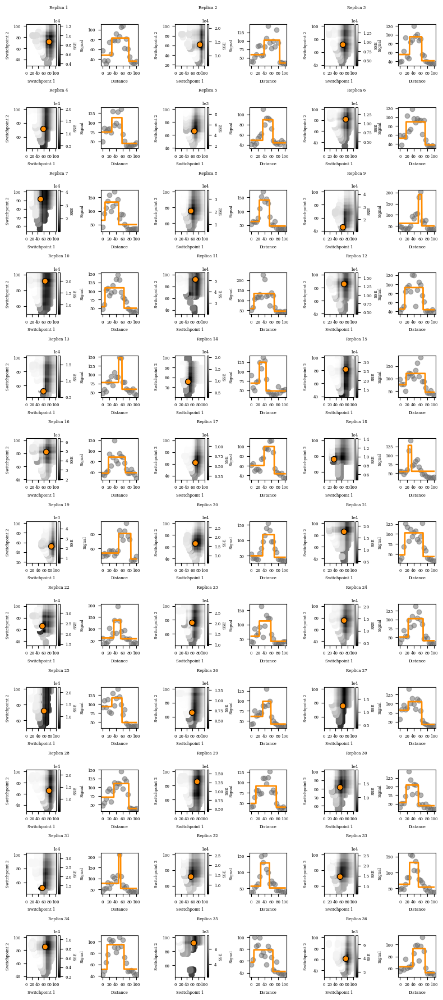

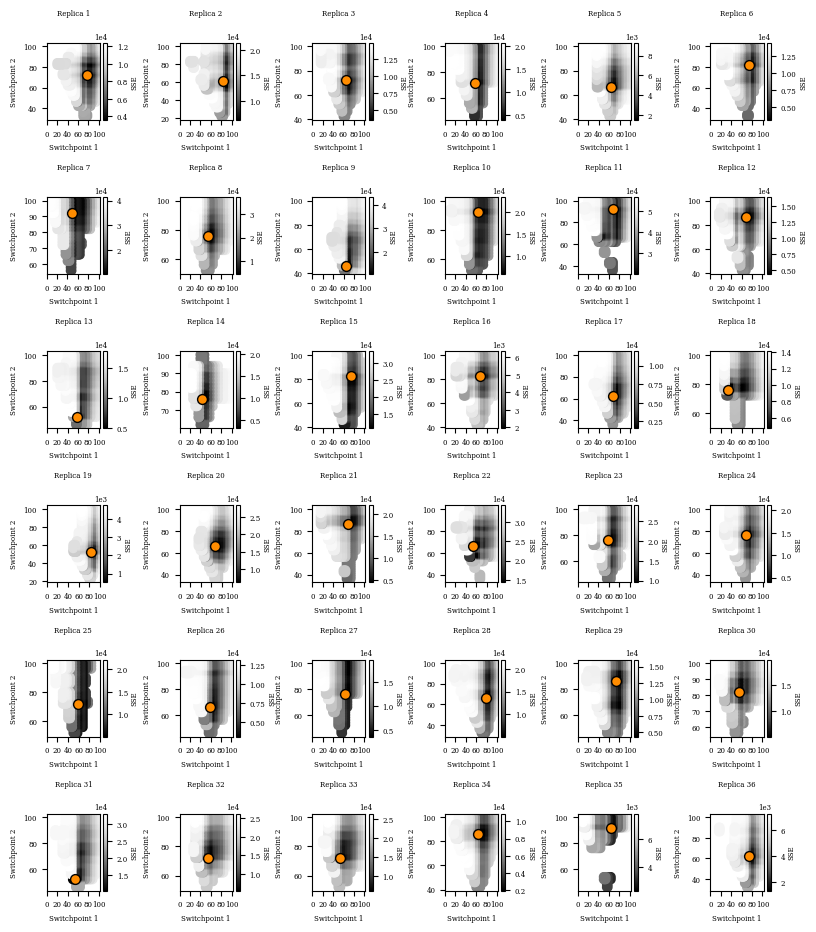

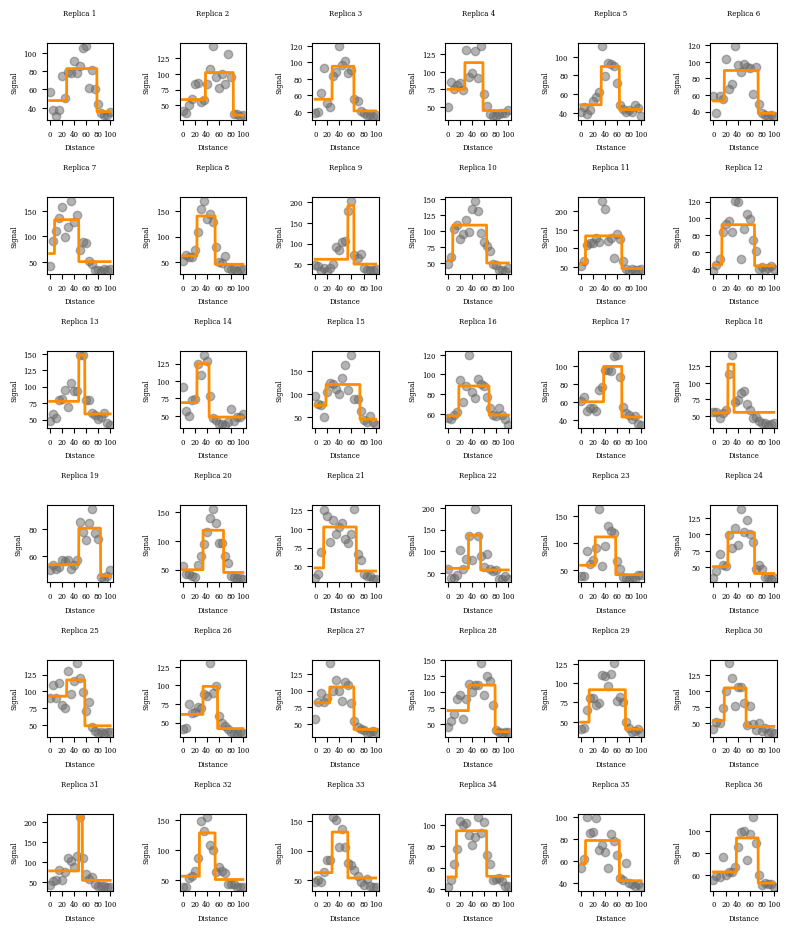

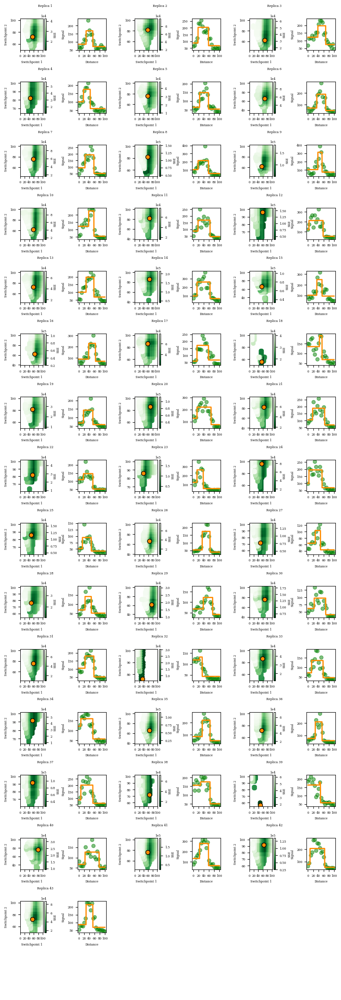

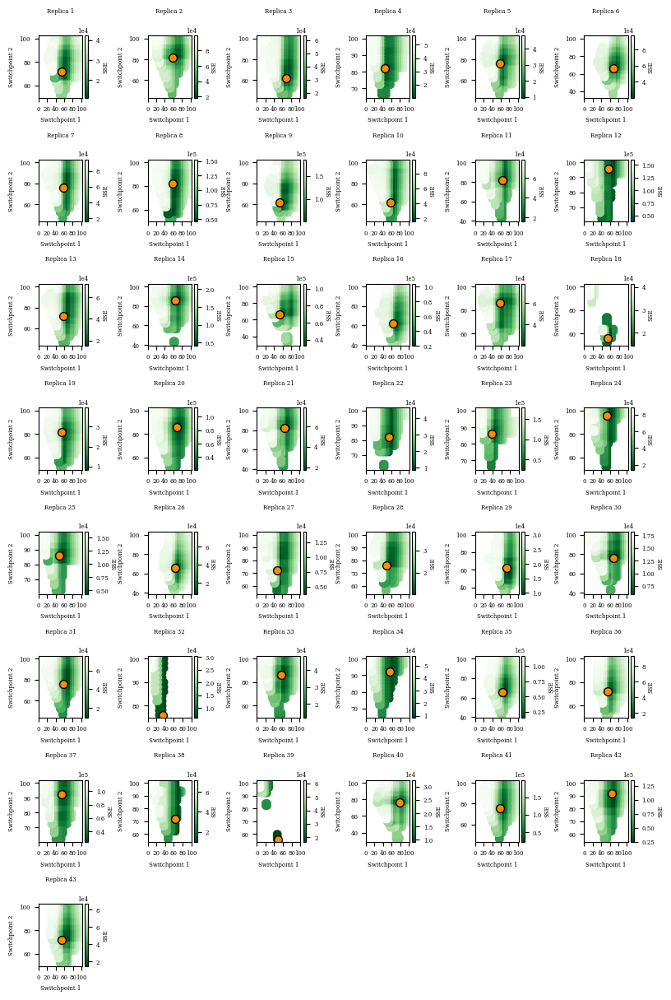

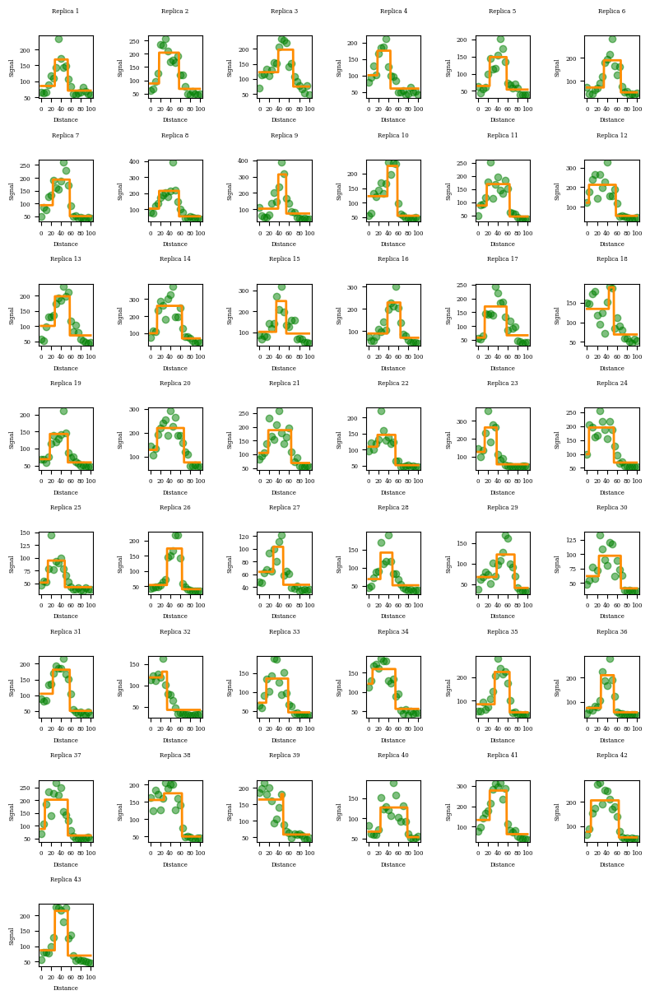

In [15]:
# Initialize the switchpoints and the fitting results dictionary
switchpoint_range = np.linspace(0, 100, num=51)
switchpoint_pairs = [(sp1, sp2) for sp1 in switchpoint_range for sp2 in switchpoint_range if sp1 < sp2]
fit_stats_three_steps = {'homeostatic': {}, 'blastema': {}}
cmaps = {'homeostatic': "Greys_r", 'blastema': "Greens_r"}

# Parameters for subplot layout
num_columns = 6
height_per_plot = 2.5
width_per_plot = 3
subplot_width = 1.57
subplot_height = 1.57

# Process Pax6 for both conditions
gene = 'Pax6'
for condition in ['homeostatic', 'blastema']:
    condition_data = sorted_replica_data_dict[gene][condition]
    x_data = condition_data['Distance'].astype(int)

    num_replicas = len(condition_data.columns) - 1
    num_rows = int(np.ceil(num_replicas / num_columns))
    fig_width = subplot_width * num_columns
    fig_height = subplot_height * num_rows * 2

    fig_combined, axes_combined = plt.subplots(num_rows * 2, num_columns, figsize=(fig_width, fig_height), gridspec_kw={'hspace': 1, 'wspace': 1})
    axes_combined = axes_combined.flatten()

    fig_sse, axes_sse = plt.subplots(num_rows, num_columns, figsize=(fig_width, fig_height / 2), gridspec_kw={'hspace': 1, 'wspace': 1})
    axes_sse = axes_sse.flatten()

    fig_expr, axes_expr = plt.subplots(num_rows, num_columns, figsize=(fig_width, fig_height / 2), gridspec_kw={'hspace': 1, 'wspace': 1})
    axes_expr = axes_expr.flatten()

    for idx, column in enumerate(condition_data.columns[1:]):
        y_data = condition_data[column]
        best_switchpoints, best_a, best_b, best_c, best_sse, sse_values = evaluate_three_step_fit(x_data, y_data, switchpoint_pairs)

        fit_stats_three_steps[condition][column] = {
            'best_switchpoints': best_switchpoints,
            'levels': (best_a, best_b, best_c),
            'best_sse': best_sse,
            'sse_values': sse_values
        }
        color = colors.get(condition, 'gray')
        
        ax_combined_sse = axes_combined[idx * 2]
        sse_array = np.array(sse_values)
        sc = ax_combined_sse.scatter(sse_array[:, 0], sse_array[:, 1], c=sse_array[:, 2], cmap=cmaps[condition], marker='o')
        ax_combined_sse.scatter(*best_switchpoints, color='darkorange', s=50, edgecolor='k', label='Best Switchpoints')
        ax_combined_sse.set_title(f'                            Replica {column}', pad=20)
        ax_combined_sse.set_xlabel('Switchpoint 1')
        ax_combined_sse.set_ylabel('Switchpoint 2')
        ax_combined_sse.invert_xaxis()
        set_inverted_xticks(ax_combined_sse)  # Set custom inverted x-tick labels
        cbar = fig_combined.colorbar(sc, ax=ax_combined_sse, label='SSE')
        cbar.formatter.set_powerlimits((0, 0))
        cbar.set_label('SSE', labelpad=2, fontsize=5)
        cbar.ax.xaxis.get_offset_text().set_fontsize(5)  # Adjust the offset text size if needed

        ax_combined_expr = axes_combined[idx * 2 + 1]
        ax_combined_expr.plot(x_data, y_data, 'o', label='Data', alpha=0.5, color=color)
        x_fit = np.linspace(min(x_data), max(x_data), 300)
        y_fit = three_step_piecewise_constant(x_fit, best_a, best_b, best_c, *best_switchpoints)
        ax_combined_expr.plot(x_fit, y_fit, '-', label='Fit', linewidth=2, color="darkorange")
        ax_combined_expr.set_xlabel('Distance')
        ax_combined_expr.set_ylabel('Signal')
        ax_combined_expr.invert_xaxis()
        set_inverted_xticks(ax_combined_expr)  # Set custom inverted x-tick labels

        ax_sse = axes_sse[idx]
        sc_sse = ax_sse.scatter(sse_array[:, 0], sse_array[:, 1], c=sse_array[:, 2], cmap=cmaps[condition], marker='o')
        ax_sse.scatter(*best_switchpoints, color='darkorange', s=50, edgecolor='k', label='Best Switchpoints')
        ax_sse.set_xlabel('Switchpoint 1')
        ax_sse.set_ylabel('Switchpoint 2')
        ax_sse.set_title(f'Replica {column}', pad=20)
        ax_sse.invert_xaxis()
        set_inverted_xticks(ax_sse)  # Set custom inverted x-tick labels
        cbar_sse = fig_sse.colorbar(sc, ax=ax_sse, label='SSE')
        cbar_sse.formatter.set_powerlimits((0, 0))
        cbar_sse.set_label('SSE', labelpad=2, fontsize=5)
        cbar_sse.ax.xaxis.get_offset_text().set_fontsize(5)  # Adjust the offset text size if needed

        ax_expr = axes_expr[idx]
        ax_expr.plot(x_data, y_data, 'o', label='Data', alpha=0.5, color=color)
        x_fit = np.linspace(min(x_data), max(x_data), 300)
        y_fit = three_step_piecewise_constant(x_fit, best_a, best_b, best_c, *best_switchpoints)
        ax_expr.plot(x_fit, y_fit, '-', label='Fit', linewidth=2, color="darkorange")
        ax_expr.set_xlabel('Distance')
        ax_expr.set_ylabel('Signal')
        ax_expr.set_title(f'Replica {column}', pad=20)
        ax_expr.invert_xaxis()
        set_inverted_xticks(ax_expr)  # Set custom inverted x-tick labels

    for ax in axes_combined[num_replicas * 2:]:
        ax.axis('off')

    for ax in axes_sse[num_replicas:]:
        ax.axis('off')

    for ax in axes_expr[num_replicas:]:
        ax.axis('off')

    # Adjust layout for the combined figure
    fig_combined.subplots_adjust(top=0.95, bottom=0.05, hspace=0.6, wspace=0.8)
    fig_combined.tight_layout(rect=[0.05, 0, 1, 0.96])

    # Adjust layout for the combined figure
    fig_combined.subplots_adjust(top=0.95, bottom=0.05, hspace=0.6, wspace=1.0)
    fig_combined.tight_layout(rect=[0.05, 0, 1, 0.96])

    # Adjust layout for SSE and Expression figures
    fig_sse.subplots_adjust(top=0.95, bottom=0.05, hspace=0.6, wspace=1.0)
    fig_expr.subplots_adjust(top=0.95, bottom=0.05, hspace=0.6, wspace=1.0)
    fig_sse.tight_layout(rect=[0.05, 0, 1, 0.96])
    fig_expr.tight_layout(rect=[0.05, 0, 1, 0.96])

    # fig_combined.savefig(f'individual_fittings/combined/combined_{gene}_{condition}_three_steps.png', format='png', dpi=600)
    fig_sse.savefig(f'individual_fittings/SSE/sse_{gene}_{condition}_three_steps.png', format='png', dpi=600)
    fig_expr.savefig(f'individual_fittings/expression/expression_{gene}_{condition}_three_steps.png', format='png', dpi=600)

    # plt.show(fig_combined)
    plt.show(fig_sse)
    plt.show(fig_expr)

## Fittings and mean fit

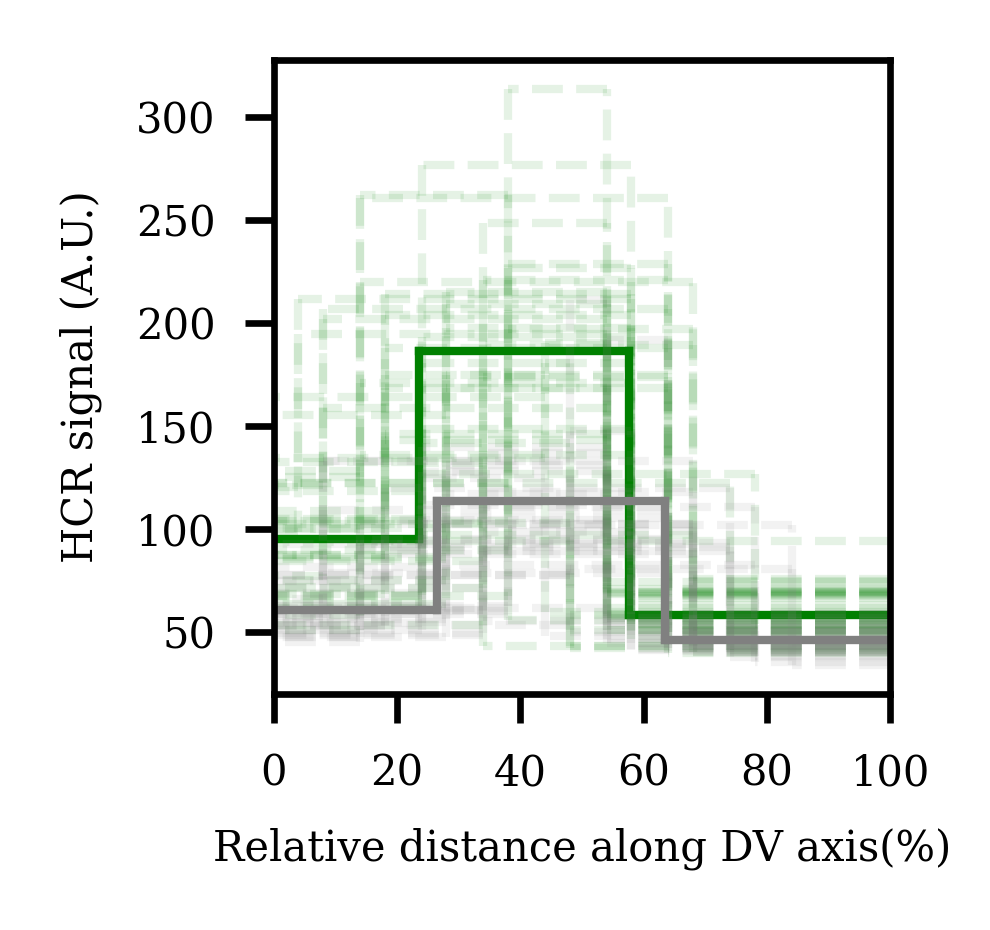

In [17]:
fit_results_three_steps = {"Pax6":{}}

plt.figure(figsize=(1.6, 1.5), dpi=600)
# plt.title(f'Expression Profiles and Fittings for {gene}')
plt.xlabel("Relative distance along DV axis(%)")
plt.ylabel("HCR signal (A.U.)")

for condition, replicas in fit_stats_three_steps.items():
    fit_results_three_steps[condition] = {}
    color = 'gray' if condition == 'homeostatic' else 'green'
    x_fit = np.linspace(0, 100, 300)
    all_a = []
    all_b = []
    all_c = []
    all_sp1 = []
    all_sp2 = []

    for i, replica_data in replicas.items():
        best_switchpoints = replica_data['best_switchpoints']
        levels = replica_data['levels']

        # Fit and plot each replica
        x_fit = np.linspace(x_data.min(), x_data.max(), 21)
        y_fit = three_step_piecewise_constant(x_data, *levels, *best_switchpoints)
        best_a = levels[0]
        best_b = levels[1]
        best_c = levels[2]
        best_switchpoint = best_switchpoints[0]
        best_switchpoint_2 = best_switchpoints[1]
        all_a.append(best_a)
        all_b.append(best_b)
        all_c.append(best_c)
        all_sp1.append(best_switchpoint)
        all_sp2.append(best_switchpoint_2)

        # Plot individual replica data and fit
        plt.plot([0, best_switchpoint], [best_a, best_a], color=color, alpha=0.1, linewidth=1, label=f'{condition.title()} fit replicas' if i == '1' else "", 
                 linestyle='--', zorder=zorder[condition])
        plt.plot([best_switchpoint, best_switchpoint_2], [best_b, best_b], color=color, alpha=0.1, linewidth=1, linestyle='--', zorder=zorder[condition])
        plt.plot([best_switchpoint_2, 100], [best_c, best_c], color=color, alpha=0.1, linewidth=1, linestyle='--', zorder=zorder[condition])
        plt.plot([best_switchpoint, best_switchpoint], [best_a, best_b], color=color, alpha=0.1, linewidth=1, linestyle='--', zorder=zorder[condition])
        plt.plot([best_switchpoint_2, best_switchpoint_2], [best_b, best_c], color=color, alpha=0.1, linewidth=1, linestyle='--', zorder=zorder[condition])

    # Calculate the mean fit
    mean_fit_a = np.mean(all_a)
    mean_fit_b = np.mean(all_b)
    mean_fit_c = np.mean(all_c)
    mean_fit_switchpoint = np.mean(all_sp1)
    mean_fit_switchpoint_2 = np.mean(all_sp2)
    
    std_fit_a = np.std(all_a)
    std_fit_b = np.std(all_b)
    std_fit_c = np.std(all_c)
    std_fit_switchpoint = np.std(all_sp1)
    std_fit_switchpoint_2 = np.std(all_sp2)

    sem_fit_a = stats.sem(all_a)
    sem_fit_b = stats.sem(all_b)
    sem_fit_c = stats.sem(all_c)
    sem_fit_switchpoint = stats.sem(all_sp1)
    sem_fit_switchpoint_2 = stats.sem(all_sp2)

    fit_results_three_steps["Pax6"][condition] = {"mean_fit_a":mean_fit_a, "mean_fit_b":mean_fit_b, "mean_fit_c":mean_fit_c, "mean_fit_switchpoint":mean_fit_switchpoint, "mean_fit_switchpoint_2":mean_fit_switchpoint_2,
                                                  "std_fit_a":std_fit_a, "std_fit_b":std_fit_b, "std_fit_c":std_fit_c, "std_fit_switchpoint":std_fit_switchpoint, "std_fit_switchpoint_2":std_fit_switchpoint_2,
                                                  "sem_fit_a":sem_fit_a, "sem_fit_b":sem_fit_b, "sem_fit_c":sem_fit_c, "sem_fit_switchpoint":sem_fit_switchpoint, "sem_fit_switchpoint_2":sem_fit_switchpoint_2}

    # Plot the mean fit
    mean_y_fit = three_step_piecewise_constant(x_fit, mean_fit_a, mean_fit_b, mean_fit_c, mean_fit_switchpoint, mean_fit_switchpoint_2)
    plt.plot([0, mean_fit_switchpoint], [mean_fit_a, mean_fit_a], color=color, linewidth=1, label=f'{condition.title()} mean fit', zorder=zorder[condition])
    plt.plot([mean_fit_switchpoint, mean_fit_switchpoint_2], [mean_fit_b, mean_fit_b], color=color, linewidth=1, zorder=zorder[condition])
    plt.plot([mean_fit_switchpoint_2, 100], [mean_fit_c, mean_fit_c], color=color, linewidth=1, zorder=zorder[condition])
    plt.plot([mean_fit_switchpoint, mean_fit_switchpoint], [mean_fit_a, mean_fit_b], color=color, linewidth=1, zorder=zorder[condition])
    plt.plot([mean_fit_switchpoint_2, mean_fit_switchpoint_2], [mean_fit_b, mean_fit_c], color=color, linewidth=1, zorder=zorder[condition])

# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
plt.xlim(0,100)
plt.tight_layout()
plt.gca().invert_xaxis()
ax = plt.gca()
set_inverted_xticks(ax)  # Set custom inverted x-tick labels
plt.savefig(f'fitting_mean/fitting_mean_Pax6-{condition}.png', format='png', dpi=600, bbox_inches='tight')
plt.show()

## Fitting and data visualization

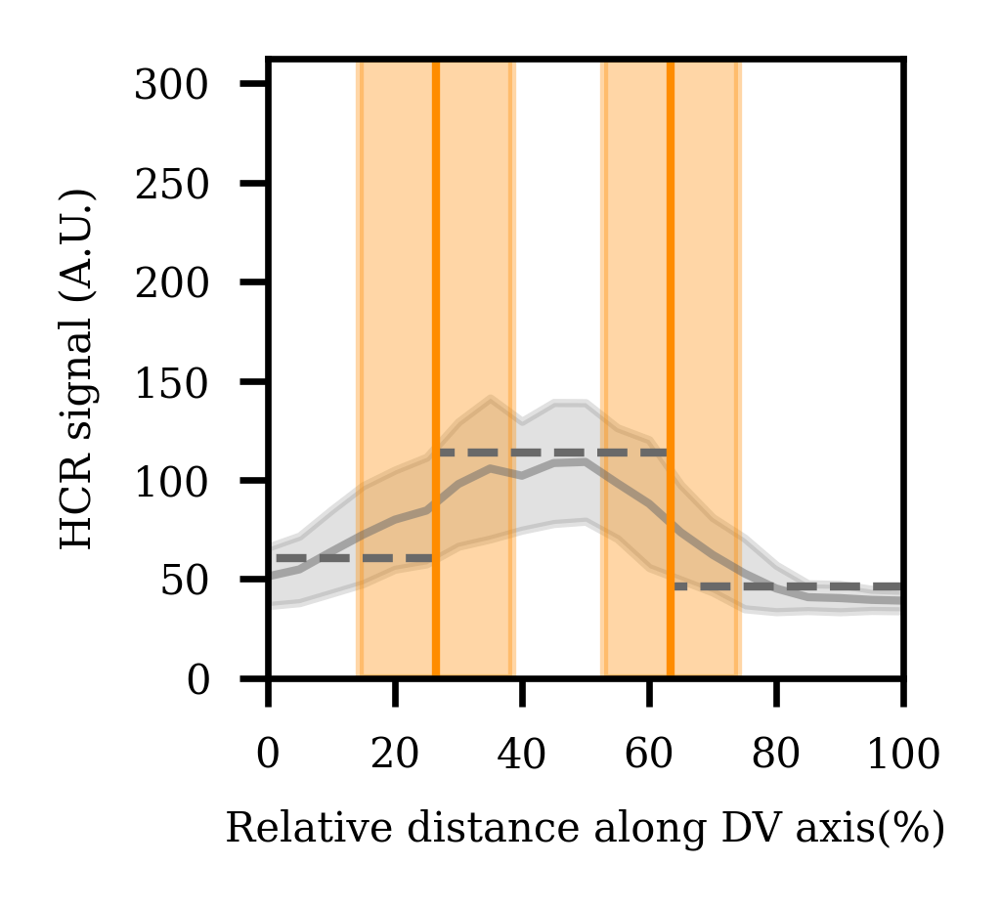

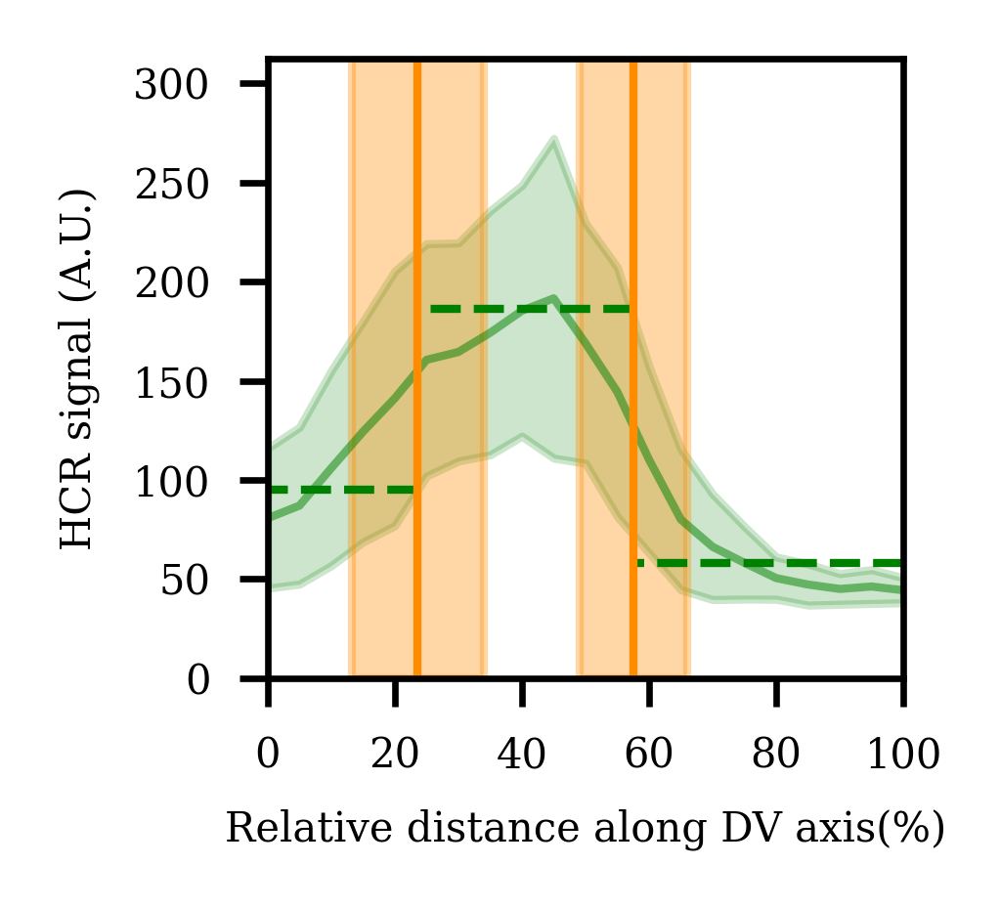

In [18]:
for gene, conditions in sorted_gene_stats.items():

    if gene not in ["Pax6"]:
        continue        
        
    # Determine the ylim for both conditions
    all_mean = []
    all_std = []
    
    for condition, stats_df in conditions.items():
        y_data = stats_df['mean']
        all_mean.extend(y_data)

        y_std = stats_df['std']
        all_std.extend(y_std)

    ymax = np.max(all_mean)+1.5* np.max(all_std)
    ymin = 0
    
    for condition, stats_df in conditions.items():
        
        plt.figure(figsize=(1.6, 1.5), dpi=600)
        # plt.title(f'Expression zone for {gene} - {condition}')
        plt.xlabel("Relative distance along DV axis(%)")
        plt.ylabel("HCR signal (A.U.)")

        color = colors.get(condition, 'gray')
            
        # Extract data points
        x_data = stats_df['Distance'].astype(int)
        y_data = stats_df['mean']
        y_errors = stats_df['std']

        # Plotting the mean data and standard deviation area
        plt.plot(x_data, y_data, label=f'Experimental mean', color=color, alpha=0.5, linewidth=1)
        plt.fill_between(x_data, y_data - y_errors, y_data + y_errors, color=color, alpha=0.2, label=f'Experimental std')

        # Generate x values for plotting
        x_fit = np.linspace(0, 100, 300)  # Adjust range as necessary

        # Inflection points and their uncertainties
        condition_data = fit_results_three_steps[gene][condition]
        mean_fit_switchpoint = condition_data["mean_fit_switchpoint"]
        std_fit_switchpoint = condition_data["std_fit_switchpoint"]
        mean_fit_switchpoint_2 = condition_data["mean_fit_switchpoint_2"]
        std_fit_switchpoint_2 = condition_data["std_fit_switchpoint_2"]
        mean_fit_a = condition_data["mean_fit_a"]
        mean_fit_b = condition_data["mean_fit_b"]
        mean_fit_c = condition_data["mean_fit_c"]

        zone_color = "darkorange"
        line_type = "solid"

        # Intensities
        plt.plot([0, mean_fit_switchpoint], [mean_fit_a, mean_fit_a], color=color, linestyle='--', linewidth=1, label=rf'Model mean intensity')
        plt.plot([mean_fit_switchpoint, mean_fit_switchpoint_2], [mean_fit_b, mean_fit_b], color=color, linestyle='--', linewidth=1)
        plt.plot([mean_fit_switchpoint_2, 100], [mean_fit_c, mean_fit_c], color=color, linestyle='--', linewidth=1)

        plt.axvline(x=mean_fit_switchpoint, color=zone_color, linewidth=1, linestyle=line_type, label=rf'Model mean switchpoints')
        plt.axvspan(xmin=mean_fit_switchpoint-std_fit_switchpoint, xmax=mean_fit_switchpoint+std_fit_switchpoint, color=zone_color, alpha=0.35)

        plt.axvline(x=mean_fit_switchpoint_2, color=zone_color, linewidth=1, linestyle=line_type)
        plt.axvspan(xmin=mean_fit_switchpoint_2-std_fit_switchpoint_2, xmax=mean_fit_switchpoint_2+std_fit_switchpoint_2, color=zone_color, label=rf'Model mean switchpoints $\pm$ std', alpha=0.35)

        plt.ylim(ymin, ymax)  
        # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
        plt.tight_layout()
        plt.xlim(0,100)
        plt.gca().invert_xaxis()
        ax = plt.gca()
        set_inverted_xticks(ax)  # Set custom inverted x-tick labels
        plt.savefig(f'mean_fits_with_data/mean_fits_with_data-{gene}-{condition}.png', dpi=600, bbox_inches='tight')  # Save the figure for each condition  
        plt.show()
    print("\n\n")

## Differences between conditions

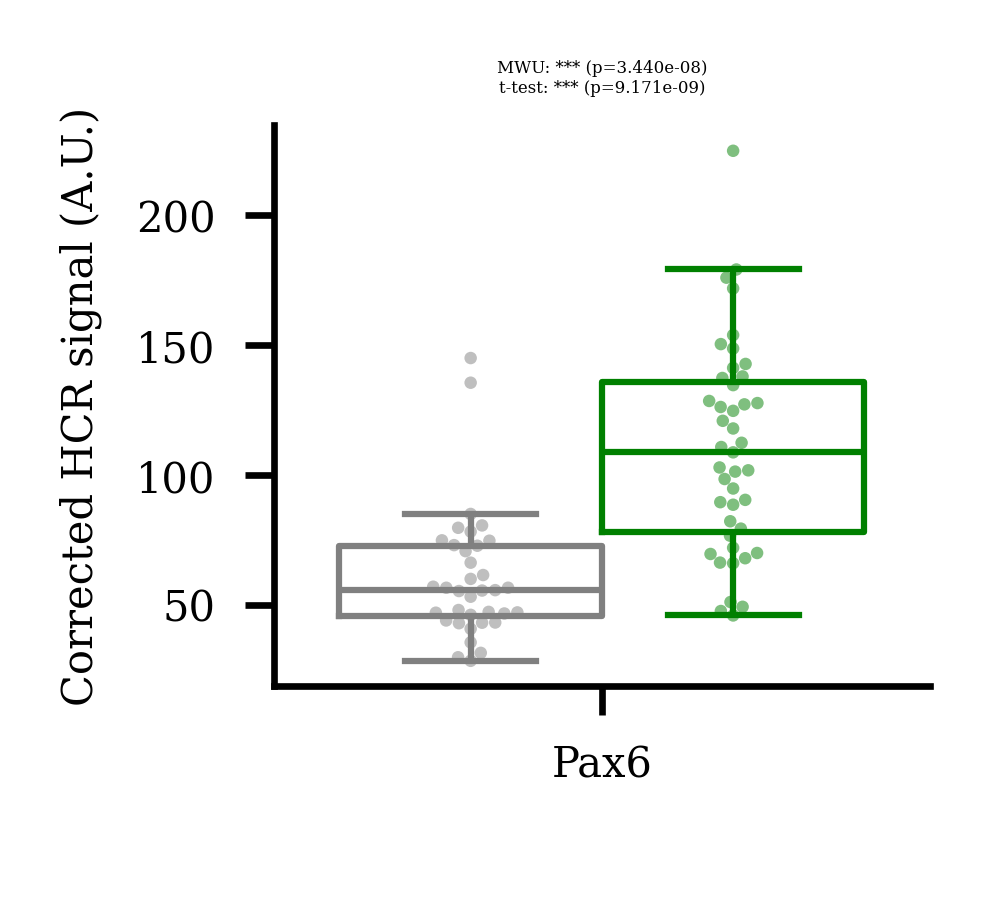

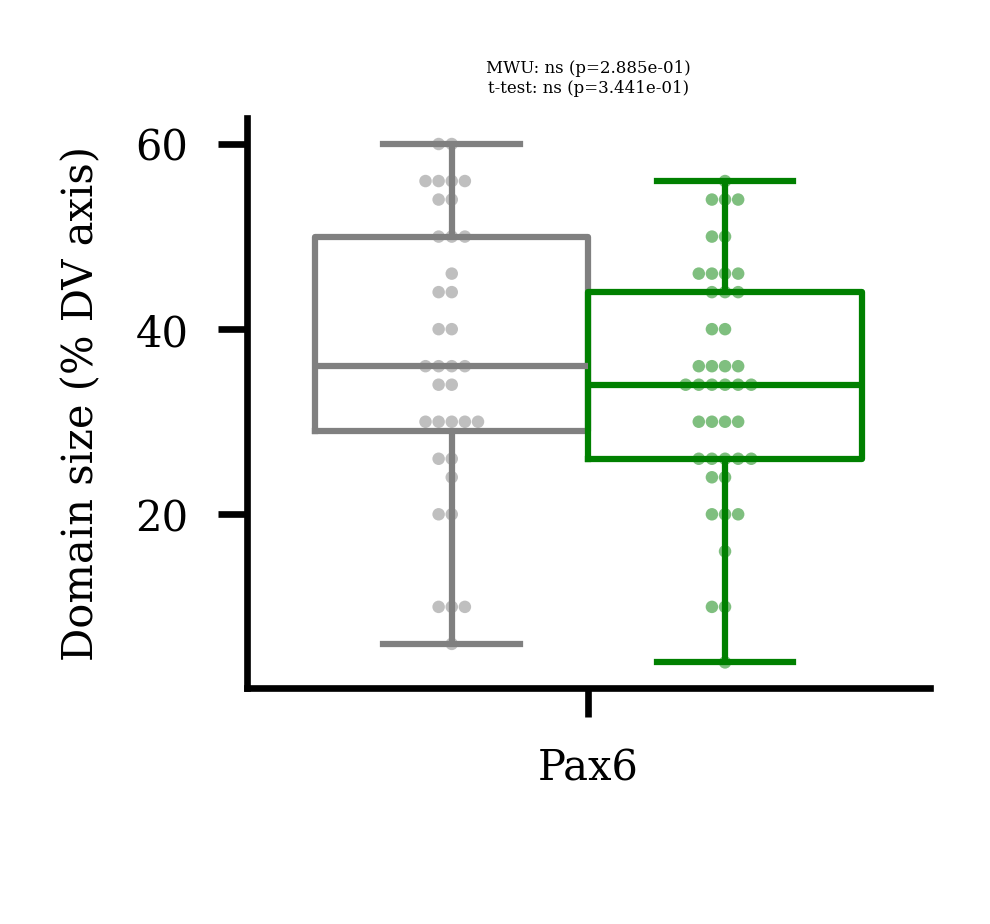

In [19]:
# Prepare the DataFrame for plotting
data = {
    'Gene': [],
    'Condition': [],
    'Replica': [],
    'Intensity': [],
    'Size': []
}

box_colors = {'homeostatic': 'gray', 'blastema': 'green'}

for condition, replicas in fit_stats_three_steps.items():
    for replica, each_stats in replicas.items():
        data['Gene'].append("Pax6")
        data['Condition'].append(condition)
        data['Replica'].append(replica)
        basal = np.mean([each_stats['levels'][0],each_stats['levels'][2]])
        data['Intensity'].append(each_stats['levels'][1]-basal)
        data['Size'].append(each_stats['best_switchpoints'][1]-each_stats['best_switchpoints'][0])

df_three_steps = pd.DataFrame(data)

# Create the boxplot
plt.figure(figsize=(1.6, 1.5), dpi=600)
ax = sns.swarmplot(x='Gene', y='Intensity', hue='Condition', data=df_three_steps, palette=box_colors, linewidth=0, zorder=0, alpha=0.5, size=1.5, edgecolor="white", dodge=True)
ax = sns.boxplot(x='Gene', y='Intensity', hue='Condition', data=df_three_steps, palette=box_colors, linewidth=0.75, fill=False, showfliers=False, flierprops=dict(markerfacecolor="white", marker="d"), zorder=1)

# Function to add statistical annotations
def add_stat_annotation(ax, data, x, y, hue, box_pairs, tests=['Mann-Whitney', 't-test']):
    for pair in box_pairs:
        group1, group2 = pair
        data1 = data[(data[x] == group1[0]) & (data[hue] == group1[1])][y]
        data2 = data[(data[x] == group2[0]) & (data[hue] == group2[1])][y]
        
        annotations = []
        
        if 'Mann-Whitney' in tests:
            stat, p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
            significance = 'ns' if p_value > 0.05 else ('*' if p_value > 0.01 else ('**' if p_value > 0.001 else '***'))
            annotations.append(f'MWU: {significance} (p={p_value:.3e})')
        
        if 't-test' in tests:
            stat, p_value = stats.ttest_ind(data1, data2, alternative='two-sided', equal_var=True)
            significance = 'ns' if p_value > 0.05 else ('*' if p_value > 0.01 else ('**' if p_value > 0.001 else '***'))
            annotations.append(f't-test: {significance} (p={p_value:.3e})')
        
        annotation_text = '\n'.join(annotations)
        ax.text(x=group1[0], y=max(data1.max(), data2.max()) + data2.max()*0.1, s=annotation_text, ha='center', fontsize=2)

# Add statistical annotations
box_pairs = [(("Pax6", "homeostatic"), ("Pax6", "blastema"))]

add_stat_annotation(ax, data=df_three_steps, x='Gene', y='Intensity', hue='Condition', box_pairs=box_pairs)

# Customizing the plot
plt.xlabel(' ')
plt.ylabel("Corrected HCR signal (A.U.)")

# Improve layout
plt.legend([],[], frameon=False)
sns.despine()
plt.tight_layout()
plt.show()

# Create the boxplot
plt.figure(figsize=(1.6, 1.5), dpi=600)
ax = sns.swarmplot(x='Gene', y='Size', hue='Condition', data=df_three_steps, palette=box_colors, linewidth=0, zorder=0, alpha=0.5, size=1.5, edgecolor="white", dodge=True)
ax = sns.boxplot(x='Gene', y='Size', hue='Condition', data=df_three_steps, palette=box_colors, linewidth=0.75, fill=False, showfliers=False, flierprops=dict(markerfacecolor="white", marker="d"), zorder=1)
add_stat_annotation(ax, data=df_three_steps, x='Gene', y='Size', hue='Condition', box_pairs=box_pairs)

# Customizing the plot
plt.xlabel(' ')
plt.ylabel(r"Domain size (% DV axis)")

# Improve layout
plt.legend([],[], frameon=False)
sns.despine()
plt.tight_layout()
plt.show()

# Piecewise constant fitting (two steps)

The piecewise constant function is defined as follows:

$$ f(x) = \begin{cases} 
a & \text{if } x < \text{switchpoint} \\
b & \text{if } x \geq \text{switchpoint}
\end{cases} $$

Where:
- \(a\) is the constant level before the switchpoint.
- \(b\) is the constant level after the switchpoint.
- \(\text{switchpoint}\) is the point at which the function changes from level \(a\) to level \(b\).

The function to fit the data involves evaluating the sum of squared errors (SSE) for all different potential switchpoints to find the best fit:

$$ \text{SSE} = \sum (y_{\text{data}} - f(x_{\text{data}}, \text{params}))^2 $$

## Fitting process and and individual fittting results visualization

In [20]:
def piecewise_constant(x, a, b, switchpoint):
    """ Piecewise constant function with two levels and a switchpoint. """
    return np.where(x < switchpoint, a, b)

In [21]:
def evaluate_piecewise_fit(x_data, y_data, switchpoints):
    best_sse = np.inf
    best_switchpoint = None
    
    # Arrays to store results for plotting
    sse_values = []
    
    for sp in switchpoints:
        # a and b are the means of their respective segments
        a = np.mean(y_data[x_data < sp])
        b = np.mean(y_data[x_data >= sp])
        
        # Calculate model predictions
        predictions = piecewise_constant(x_data, a, b, sp)
        
        # Calculate the sum of squared errors
        sse = np.sum((y_data - predictions) ** 2)
        sse_values.append(sse)
        
        # Update the best parameters if current sse is lower
        if sse < best_sse:
            best_sse = sse
            best_a = a
            best_b = b
            best_switchpoint = sp
    
    return best_switchpoint, best_a, best_b, best_sse, sse_values

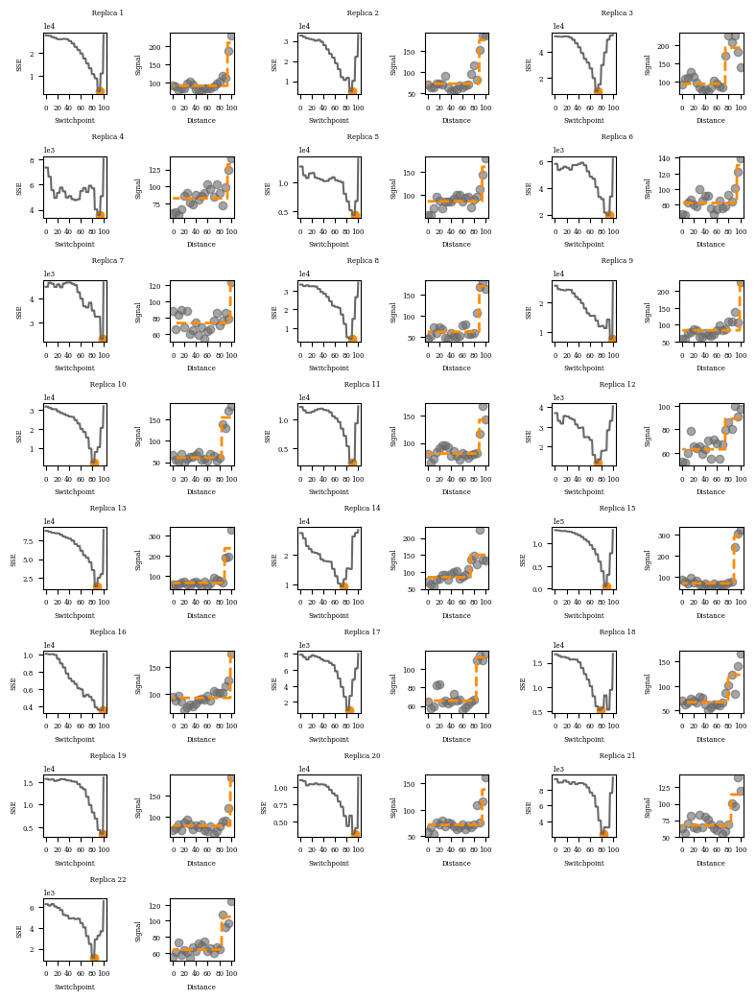

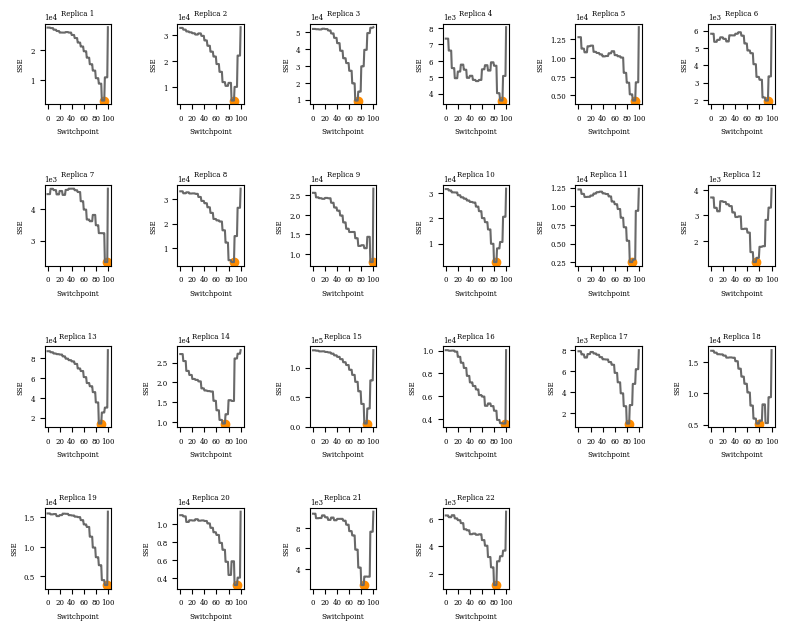

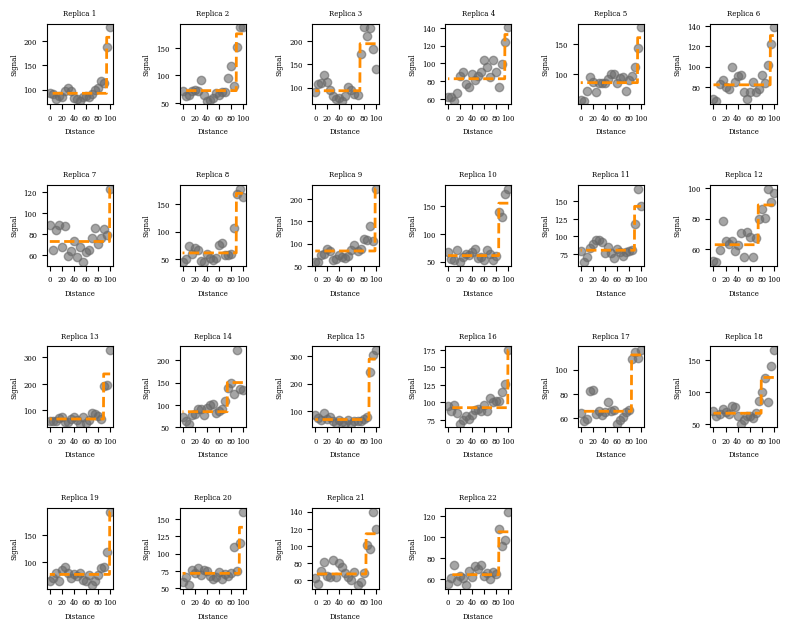

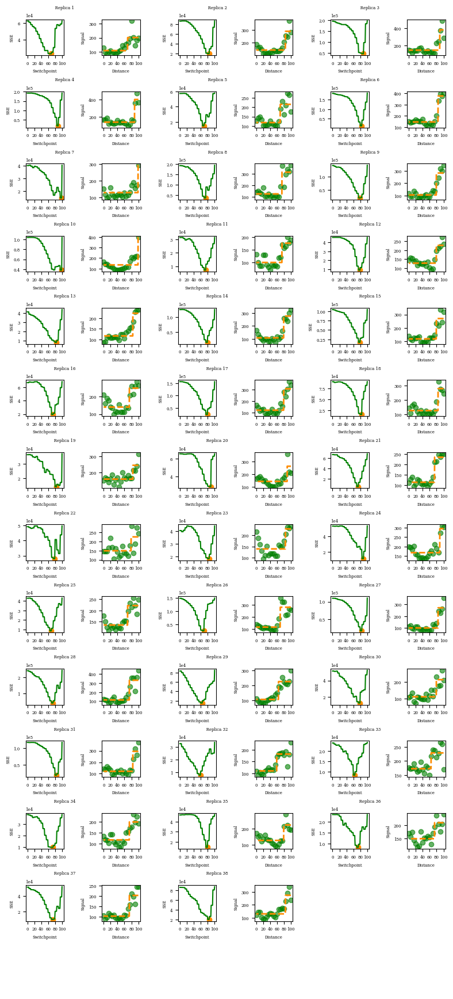

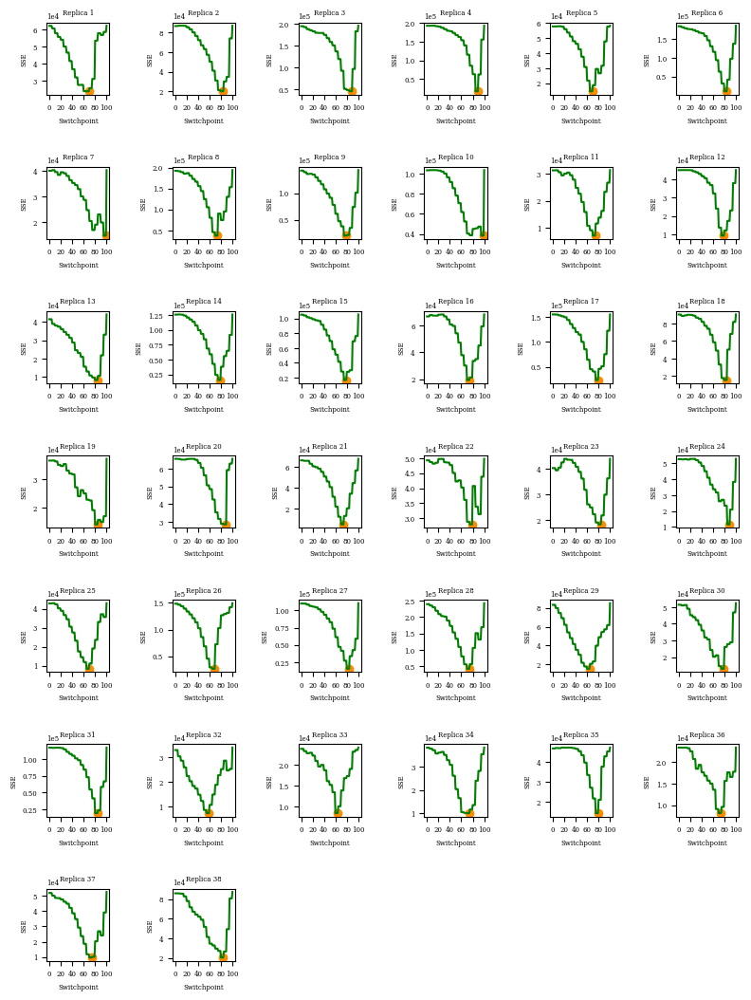

...

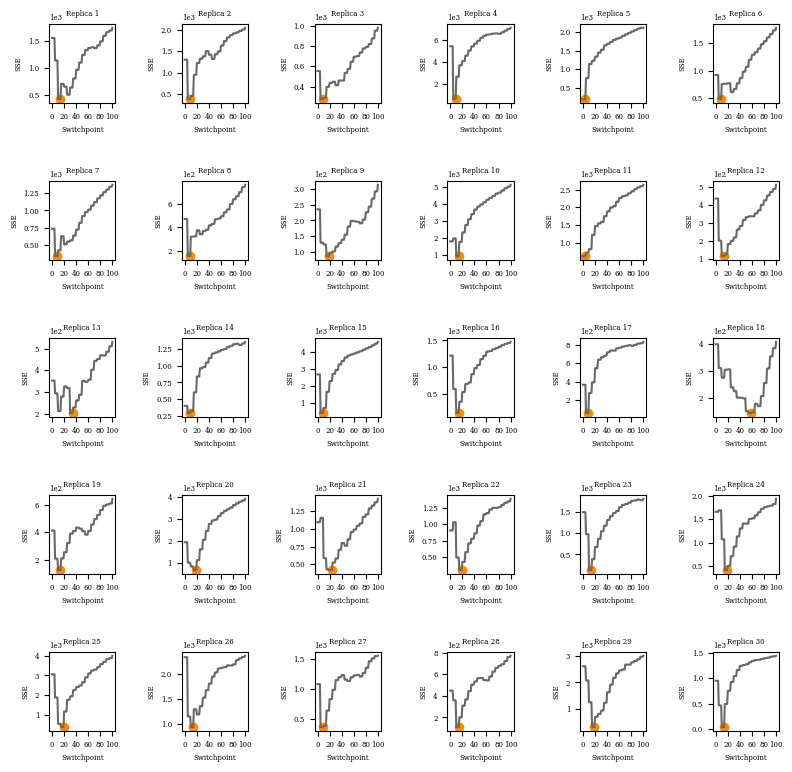

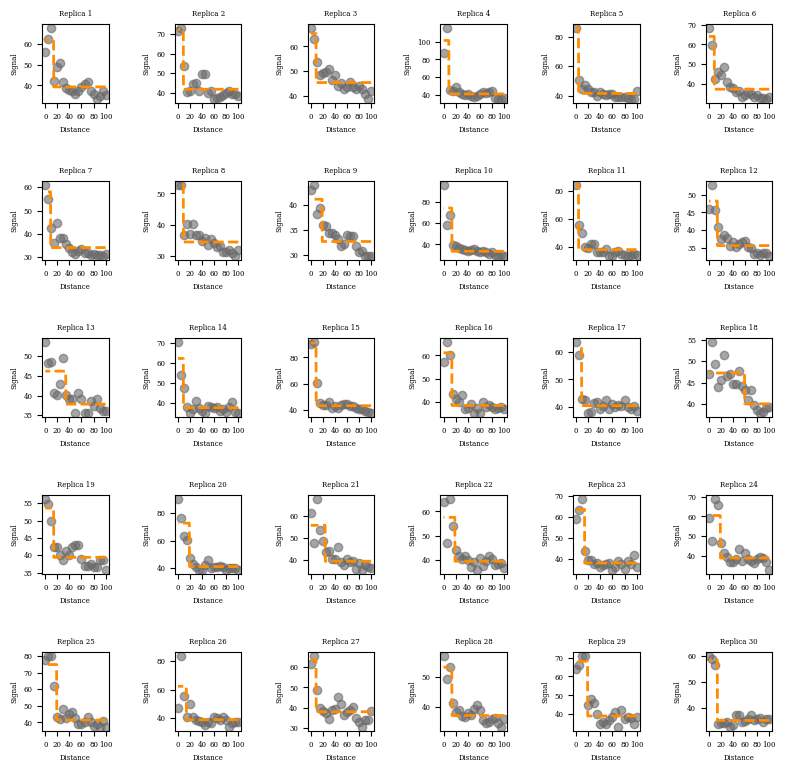

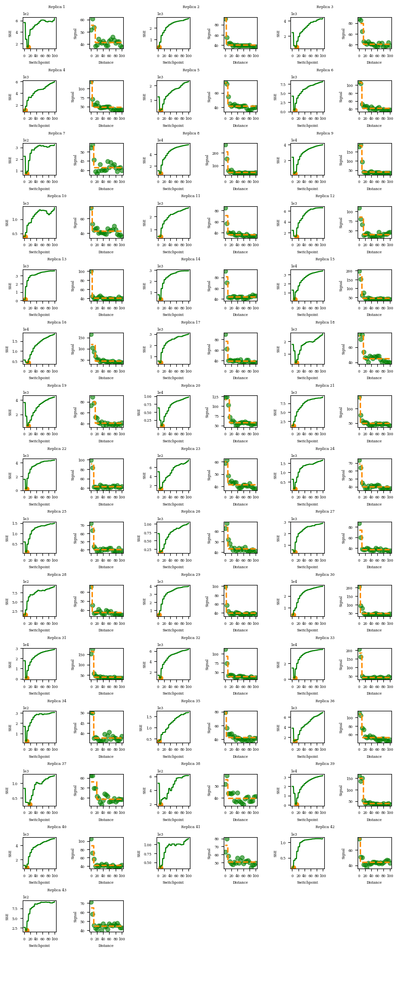

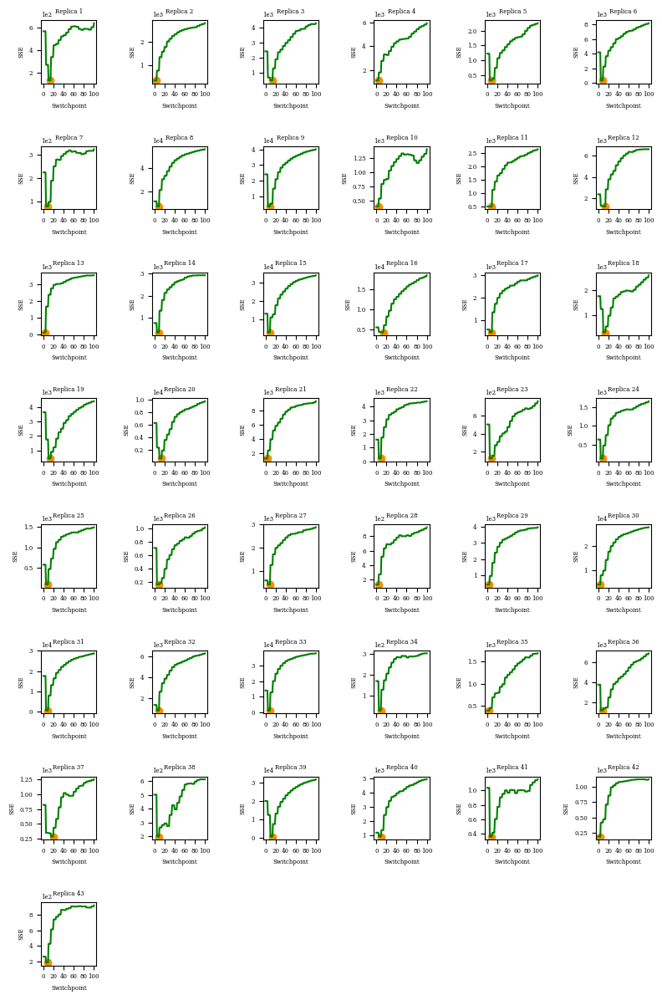

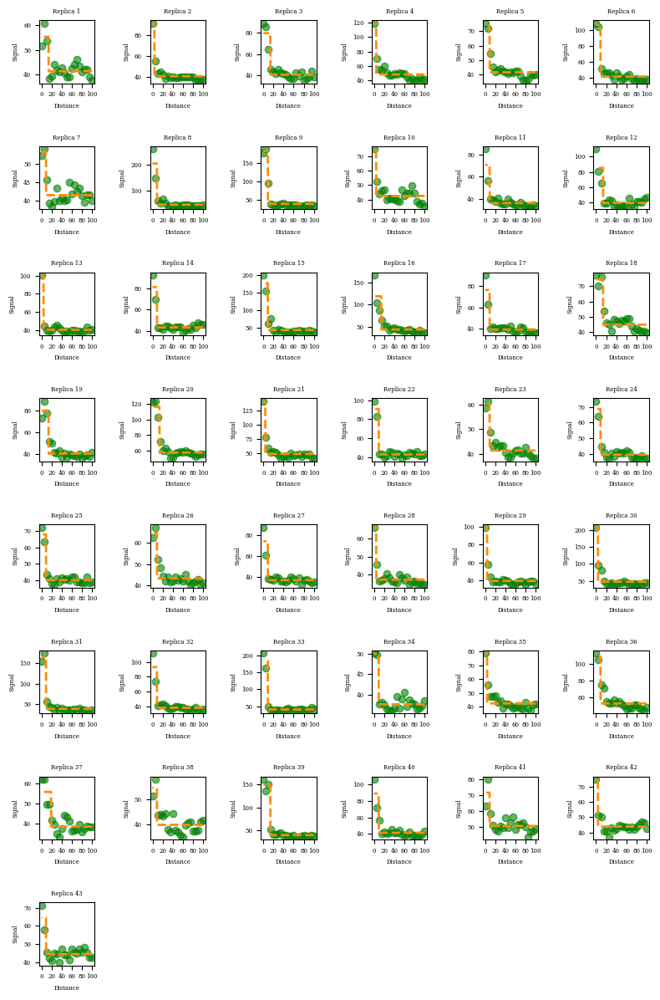

In [22]:
# Initialize the dictionary to store fitting statistics
fit_stats_two_steps = {}

# Parameters for subplot layout
num_columns = 6
height_per_plot = 2.5
width_per_plot = 3
subplot_width = 1.57
subplot_height = 1.57

# Loop through each gene and its conditions
for gene, conditions in sorted_replica_data_dict.items():
    if gene in ["Sox2","Pax6"]:
        continue

    fit_stats_two_steps[gene] = {}

    for condition, df in conditions.items():
        fit_stats_two_steps[gene][condition] = {}
        x_data = df['Distance'].astype(int)
        switchpoints = np.linspace(0, 100, num=101)  # Switchpoints range

        color = colors[condition]

        num_replicas = len(df.columns) - 1  # Number of replicas (excluding 'Distance' column)
        num_rows = int(np.ceil(num_replicas / num_columns))

        # Calculate total figure size
        fig_width = subplot_width * num_columns  # Total width of the figure
        fig_height = subplot_height * num_rows * 2  # Total height of the figure (each subplot pair is 2 rows high)

        # Create subplots for the combined figure
        fig_combined, axes_combined = plt.subplots(num_rows * 2, num_columns, figsize=(fig_width, fig_height), gridspec_kw={'hspace': 1, 'wspace': 1})
        axes_combined = axes_combined.flatten()  # Flatten to easily iterate over axes

        # Create subplots for SSE plots
        fig_sse, axes_sse = plt.subplots(num_rows, num_columns, figsize=(fig_width, fig_height / 2), gridspec_kw={'hspace': 1, 'wspace': 1})
        axes_sse = axes_sse.flatten()

        # Create subplots for Expression plots
        fig_expr, axes_expr = plt.subplots(num_rows, num_columns, figsize=(fig_width, fig_height / 2), gridspec_kw={'hspace': 1, 'wspace': 1})
        axes_expr = axes_expr.flatten()

        for idx, column in enumerate(df.columns[1:]):  # Skip 'Distance' column
            if column in df.columns:
                y_data = df[column]
                best_switchpoint, best_a, best_b, best_sse, sse_values = evaluate_piecewise_fit(x_data, y_data, switchpoints)

                # Store the best fitting parameters and the covariance matrix
                fit_stats_two_steps[gene][condition][column] = {
                    'best_switchpoint': best_switchpoint,
                    'best_a': best_a,
                    'best_b': best_b
                }

                # Combined figure: SSE plot
                ax_combined_sse = axes_combined[idx * 2]
                ax_combined_sse.plot(switchpoints, sse_values, label='SSE', color=color)
                ax_combined_sse.scatter([best_switchpoint], [best_sse], color='darkorange', label='Best Switchpoint')
                ax_combined_sse.set_xlabel('Switchpoint')
                ax_combined_sse.set_ylabel('SSE')
                ax_combined_sse.ticklabel_format(style='scientific', axis='y', scilimits=(0, 0))
                ax_combined_sse.set_title(f'                               Replica {column}')
                ax_combined_sse.invert_xaxis()
                set_inverted_xticks(ax_combined_sse)  # Set custom inverted x-tick labels
                
                # Combined figure: Expression plot
                ax_combined_expr = axes_combined[idx * 2 + 1]
                x_fit = np.linspace(x_data.min(), x_data.max(), 300)
                y_fit = piecewise_constant(x_fit, best_a, best_b, best_switchpoint)
                ax_combined_expr.scatter(x_data, y_data, color=color, alpha=0.6, label=f'Replica {column} Data')
                ax_combined_expr.plot(x_fit, y_fit, linestyle='--', color="darkorange", linewidth=2, label='Fit')
                ax_combined_expr.set_xlabel('Distance')
                ax_combined_expr.set_ylabel('Signal')
                ax_combined_expr.invert_xaxis()
                set_inverted_xticks(ax_combined_expr)  # Set custom inverted x-tick labels

                # Separate figure: SSE plot
                ax_sse = axes_sse[idx]
                ax_sse.plot(switchpoints, sse_values, label='SSE', color=color)
                ax_sse.scatter([best_switchpoint], [best_sse], color='darkorange', label='Best Switchpoint')
                ax_sse.set_xlabel('Switchpoint')
                ax_sse.set_ylabel('SSE')
                ax_sse.ticklabel_format(style='scientific', axis='y', scilimits=(0, 0))
                ax_sse.set_title(f'Replica {column}')
                ax_sse.invert_xaxis()
                set_inverted_xticks(ax_sse)  # Set custom inverted x-tick labels
                
                # Separate figure: Expression plot
                ax_expr = axes_expr[idx]
                ax_fit = np.linspace(x_data.min(), x_data.max(), 300)
                y_fit = piecewise_constant(ax_fit, best_a, best_b, best_switchpoint)
                ax_expr.scatter(x_data, y_data, color=color, alpha=0.6, label=f'Replica {column} Data')
                ax_expr.plot(ax_fit, y_fit, linestyle='--', color="darkorange", linewidth=2, label='Fit')
                ax_expr.set_xlabel('Distance')
                ax_expr.set_ylabel('Signal')
                ax_expr.set_title(f'Replica {column}')
                ax_expr.invert_xaxis()
                set_inverted_xticks(ax_expr)  # Set custom inverted x-tick labels
                
        # Hide any unused subplots for the combined figure
        for ax in axes_combined[num_replicas * 2:]:
            ax.axis('off')

        # Hide any unused subplots for SSE plots
        for ax in axes_sse[num_replicas:]:
            ax.axis('off')

        # Hide any unused subplots for Expression plots
        for ax in axes_expr[num_replicas:]:
            ax.axis('off')

        # # Adjust layout for the combined figure
        # fig_combined.subplots_adjust(top=0.95, bottom=0.05, hspace=0.6, wspace=0.6)
        # fig_combined.tight_layout(rect=[0.05, 0, 1, 0.96])

        # Adjust layout for SSE and Expression figures
        fig_sse.subplots_adjust(top=0.95, bottom=0.05, hspace=0.6, wspace=0.6)
        fig_expr.subplots_adjust(top=0.95, bottom=0.05, hspace=0.6, wspace=0.6)
        fig_sse.tight_layout(rect=[0.05, 0, 1, 0.96])
        fig_expr.tight_layout(rect=[0.05, 0, 1, 0.96])

        # Save figures
        # fig_combined.savefig(f'piecewise/individual_fittings/combined/combined_{gene}_{condition}.png', format='png', dpi=600)
        fig_sse.savefig(f'individual_fittings/SSE/SSE_{gene}_{condition}.png', format='png', dpi=600)
        fig_expr.savefig(f'individual_fittings/expression/expression_{gene}_{condition}.png', format='png', dpi=600)

        # Show figures
        # plt.show(fig_combined)
        plt.show(fig_sse)
        plt.show(fig_expr)

## Fittings and mean fit visualization

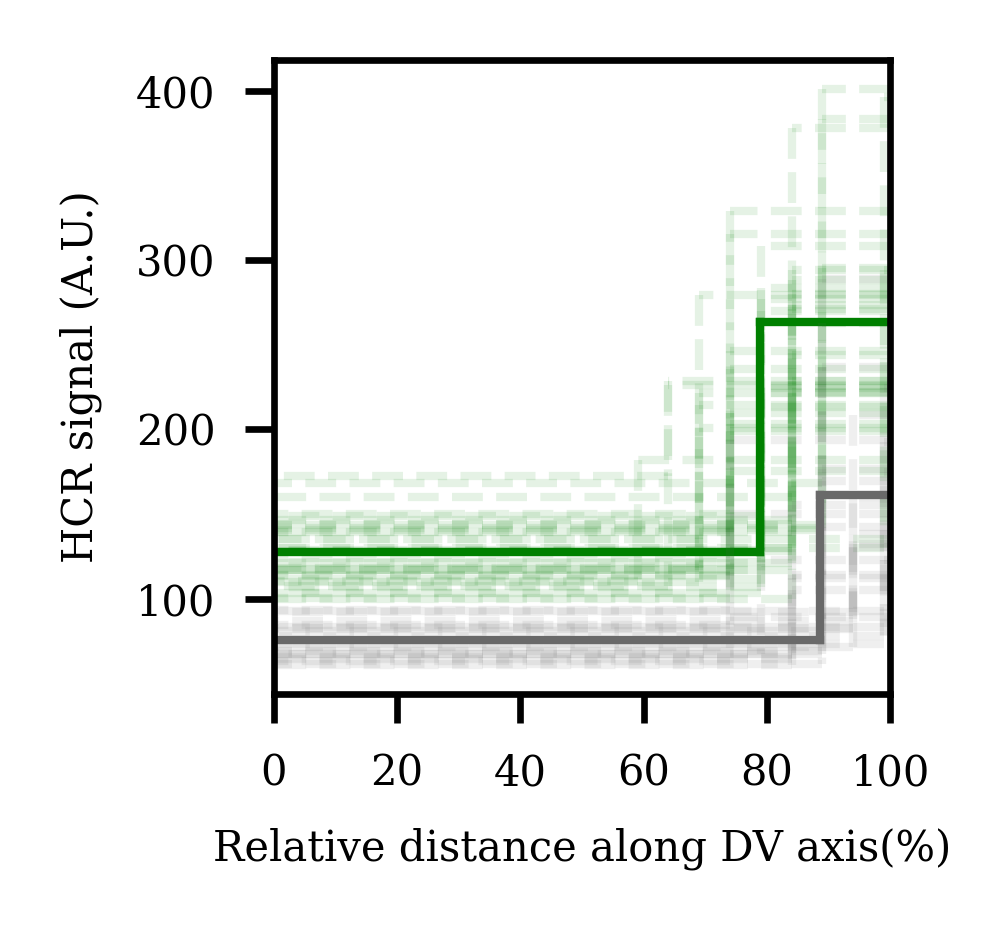

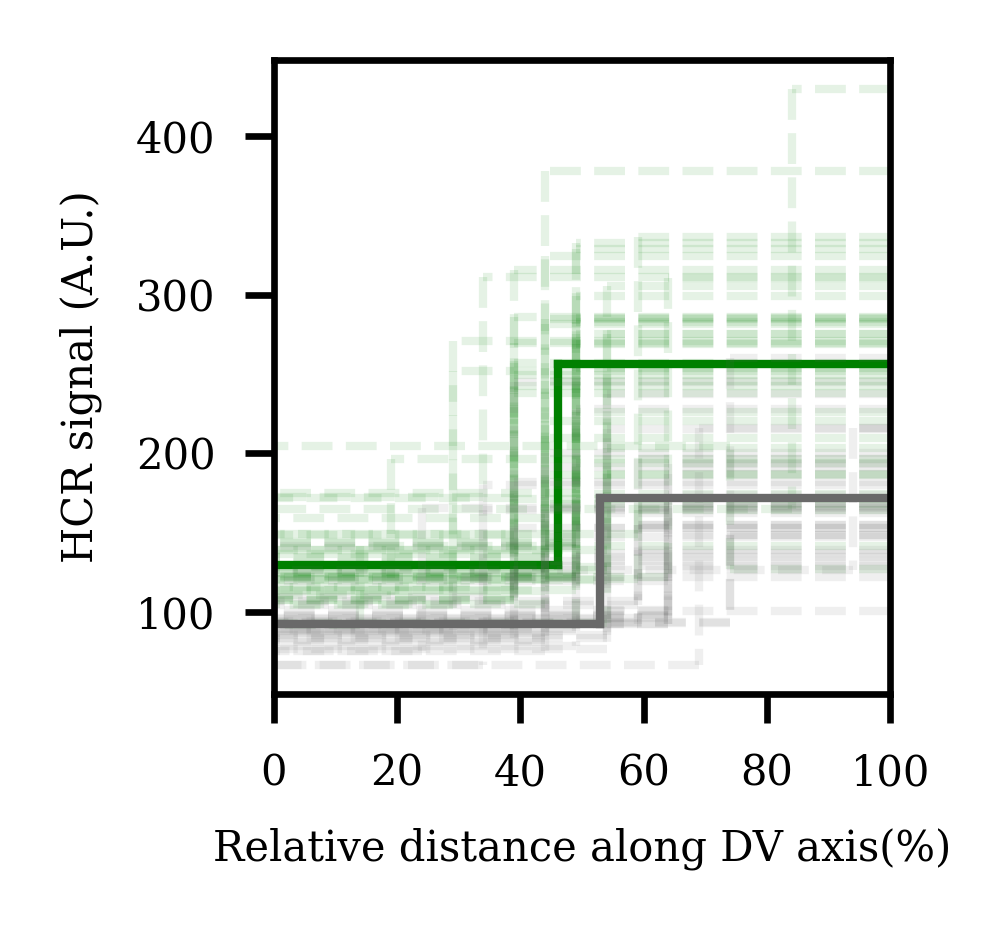

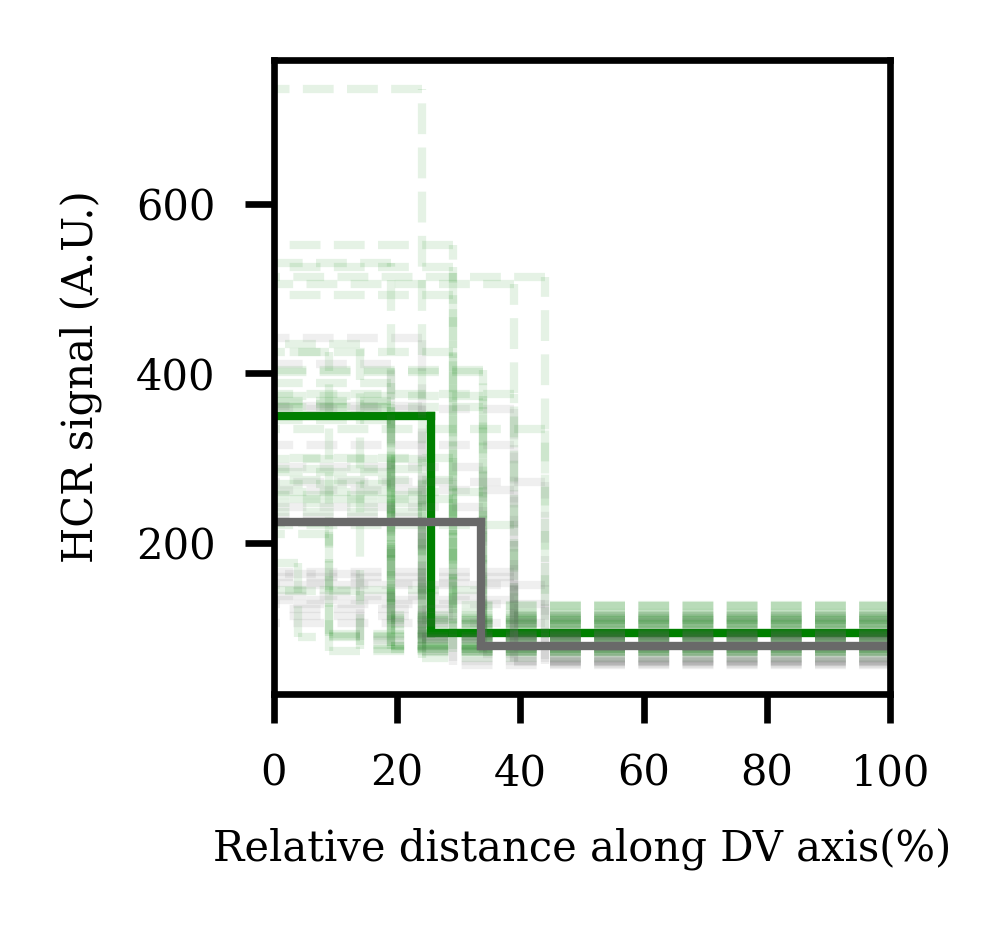

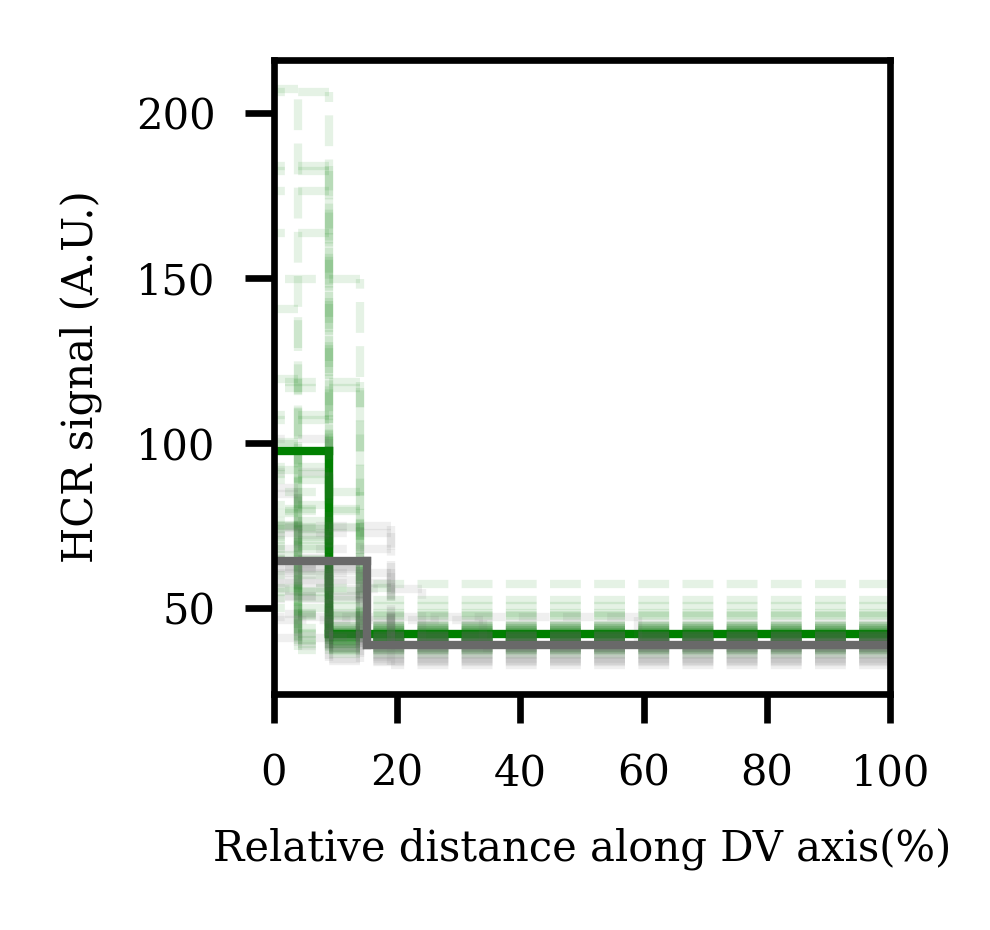

In [24]:
# Loop through each gene, excluding "Sox2"
fit_results_two_steps = {}
    
for gene, conditions in fit_stats_two_steps.items():
    if gene in  ["Sox2", "Pax6"]:
        continue
        
    plt.figure(figsize=(1.6, 1.5), dpi=600)
    plt.xlabel("Relative distance along DV axis(%)")
    plt.ylabel("HCR signal (A.U.)")

    # Prepare to collect data
    mean_fits = {}
    fit_results_two_steps[gene] = {}
    
    # Process each condition and plot each replica's data and fit
    for condition, replicas in conditions.items():
        fit_results_two_steps[gene][condition] = {}
        color = colors[condition]
        x_fit = np.linspace(0, 100, 300)  # Adjust range for fitting plot
        all_a = []
        all_b = []
        all_switchpoint = []

        for i, replica_data in replicas.items():
            best_a = replica_data['best_a']
            best_b = replica_data['best_b']
            best_switchpoint = replica_data['best_switchpoint']
            x_data = sorted_replica_data_dict[gene][condition]['Distance'].astype(int)
            y_data = sorted_replica_data_dict[gene][condition][i]

            # Compute the fit using the piecewise constant model
            y_fit = piecewise_constant(x_data, best_a, best_b, best_switchpoint)
            all_a.append(best_a)
            all_b.append(best_b)
            all_switchpoint.append(best_switchpoint)

            # Plot individual replica data and fit
            plt.plot([0, best_switchpoint], [best_a, best_a], color=color, alpha=0.1, linewidth=1, label=f'{condition.title()} fit replicas' if i == '1' else "", 
                     linestyle='--', zorder=zorder[condition])
            plt.plot([best_switchpoint, 100], [best_b, best_b], color=color, alpha=0.1, linewidth=1, linestyle='--', zorder=zorder[condition])
            plt.plot([best_switchpoint, best_switchpoint], [best_a, best_b], color=color, alpha=0.1, linewidth=1, linestyle='--', zorder=zorder[condition])

            
        # Mean results
        mean_fit_a = np.mean(all_a, axis=0)
        mean_fit_b = np.mean(all_b, axis=0)
        mean_fit_switchpoint = np.mean(all_switchpoint, axis=0)
        std_fit_a = np.std(all_a, axis=0)
        std_fit_b = np.std(all_b, axis=0)
        std_fit_switchpoint = np.std(all_switchpoint, axis=0)
        sem_fit_a = stats.sem(all_a, axis=0)
        sem_fit_b = stats.sem(all_b, axis=0)
        sem_fit_switchpoint = stats.sem(all_switchpoint, axis=0)
        fit_results_two_steps[gene][condition] = {"mean_fit_a":mean_fit_a, "mean_fit_b":mean_fit_b, "mean_fit_switchpoint":mean_fit_switchpoint, 
                                                  "std_fit_a":std_fit_a, "std_fit_b":std_fit_b, "std_fit_switchpoint":std_fit_switchpoint,
                                                  "sem_fit_a":sem_fit_a, "sem_fit_b":sem_fit_b, "sem_fit_switchpoint":sem_fit_switchpoint}

        # Plot the mean fit
        plt.plot([0, mean_fit_switchpoint], [mean_fit_a, mean_fit_a], color=color, linewidth=1, label=f'{condition.title()} mean fit', zorder=zorder[condition])
        plt.plot([mean_fit_switchpoint, 100], [mean_fit_b, mean_fit_b], color=color, linewidth=1, zorder=zorder[condition])
        plt.plot([mean_fit_switchpoint, mean_fit_switchpoint], [mean_fit_a, mean_fit_b], color=color, linewidth=1, zorder=zorder[condition])
        
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
    plt.xlim(0,100)
    plt.tight_layout()
    plt.gca().invert_xaxis()
    ax = plt.gca()
    set_inverted_xticks(ax)  # Set custom inverted x-tick labels
    plt.savefig(f'fitting_mean/fitting_mean_{gene}-{condition}.png', dpi=600, bbox_inches='tight')
    plt.show()

## Fitting and data visualization

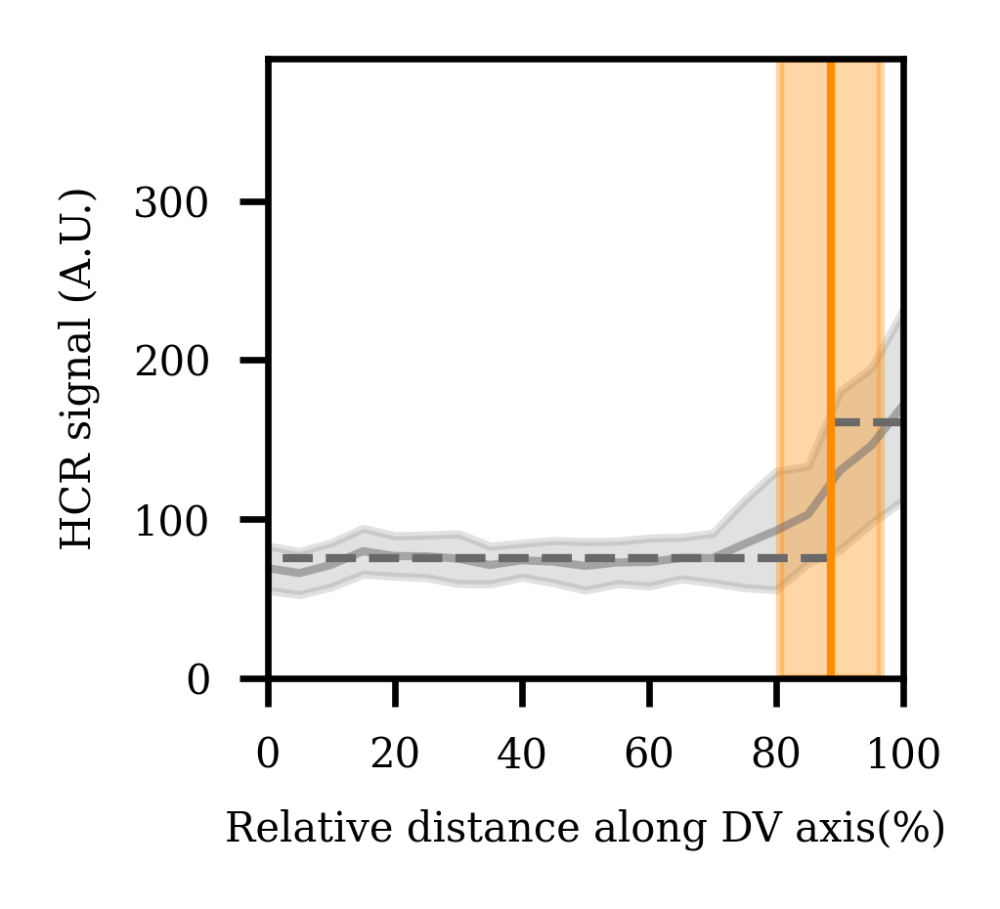

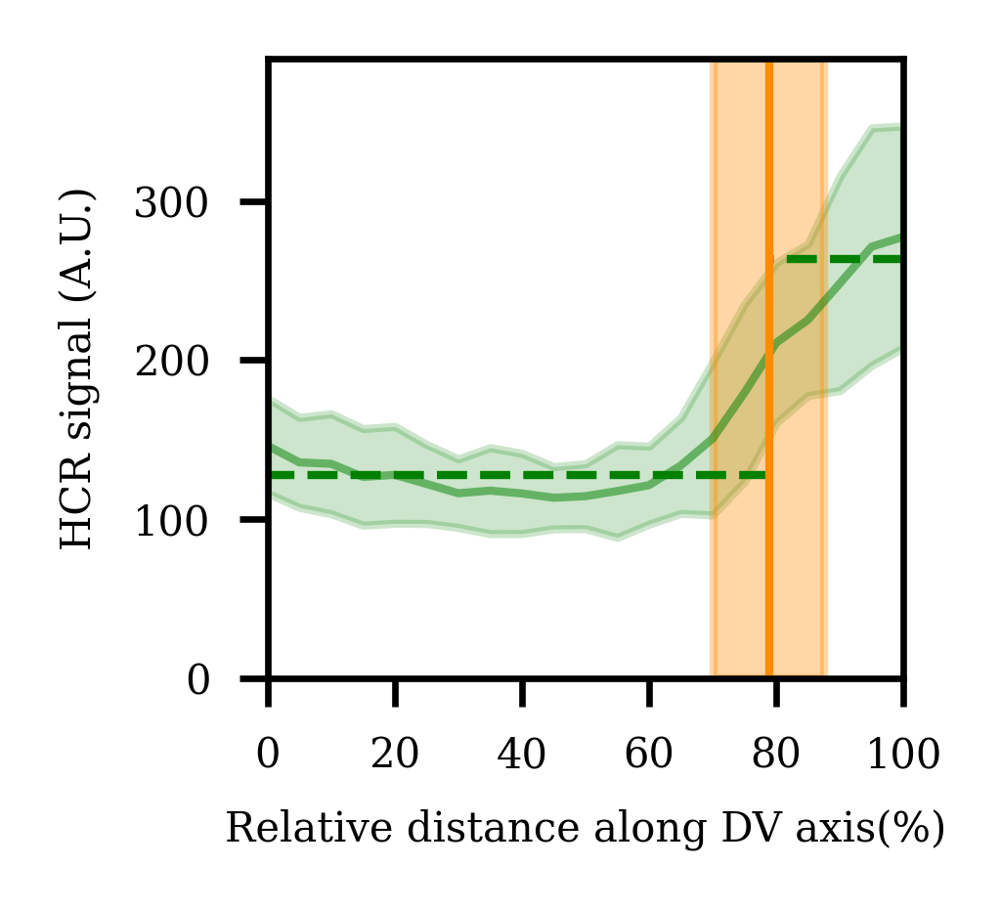

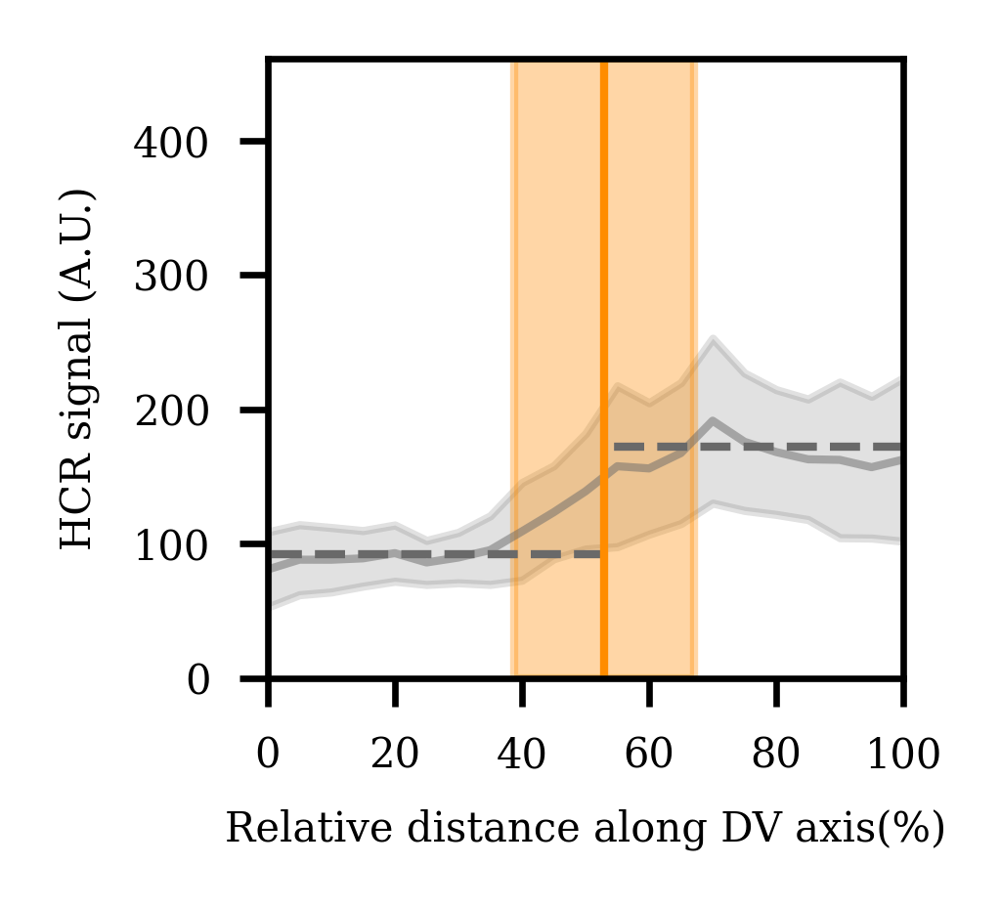

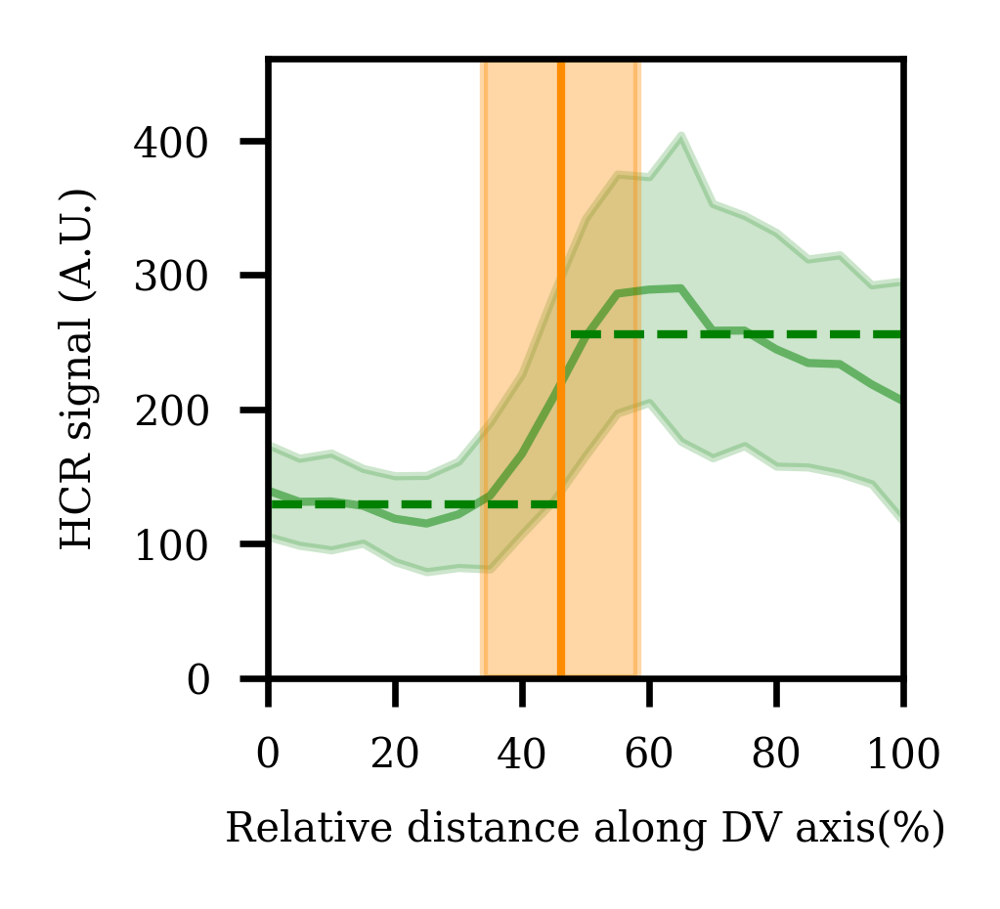

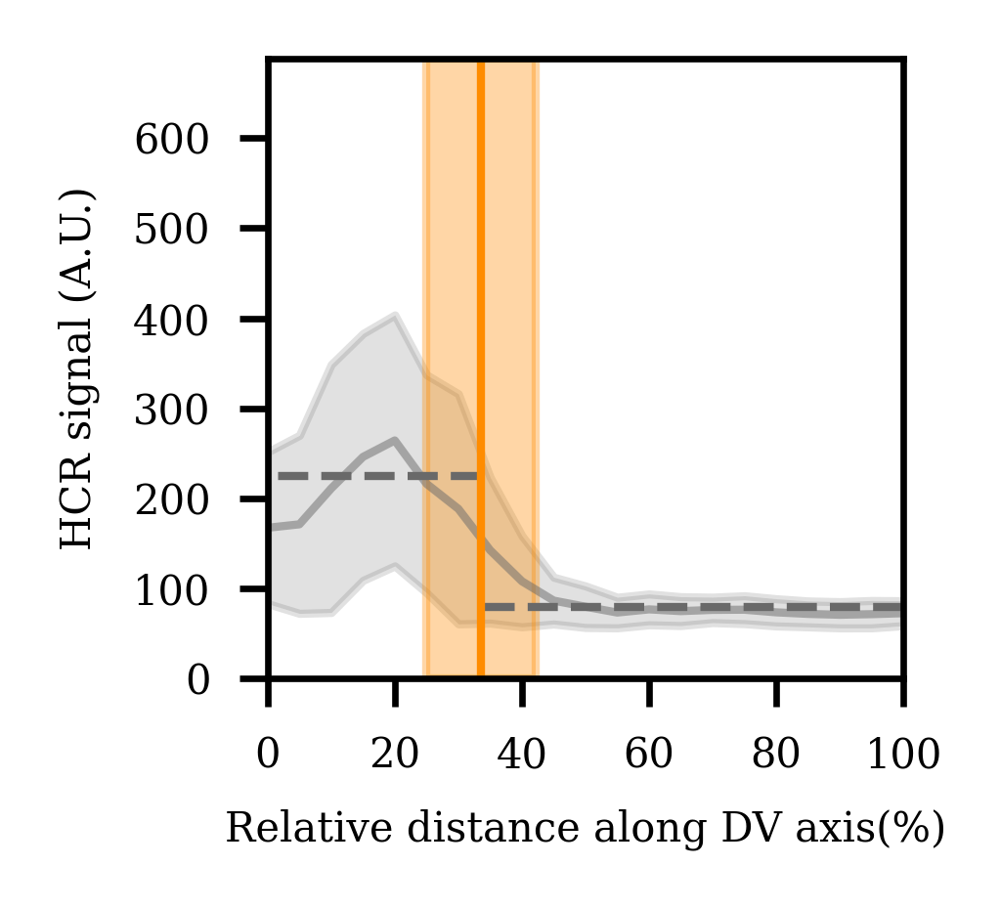

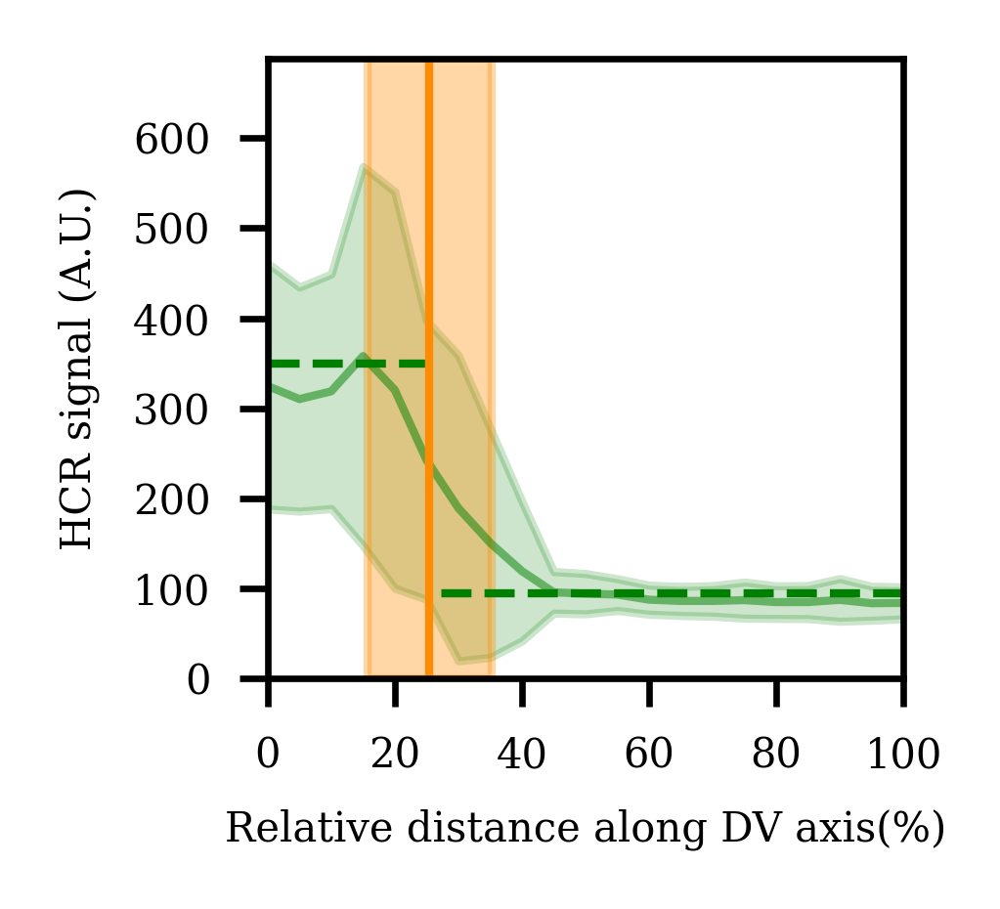

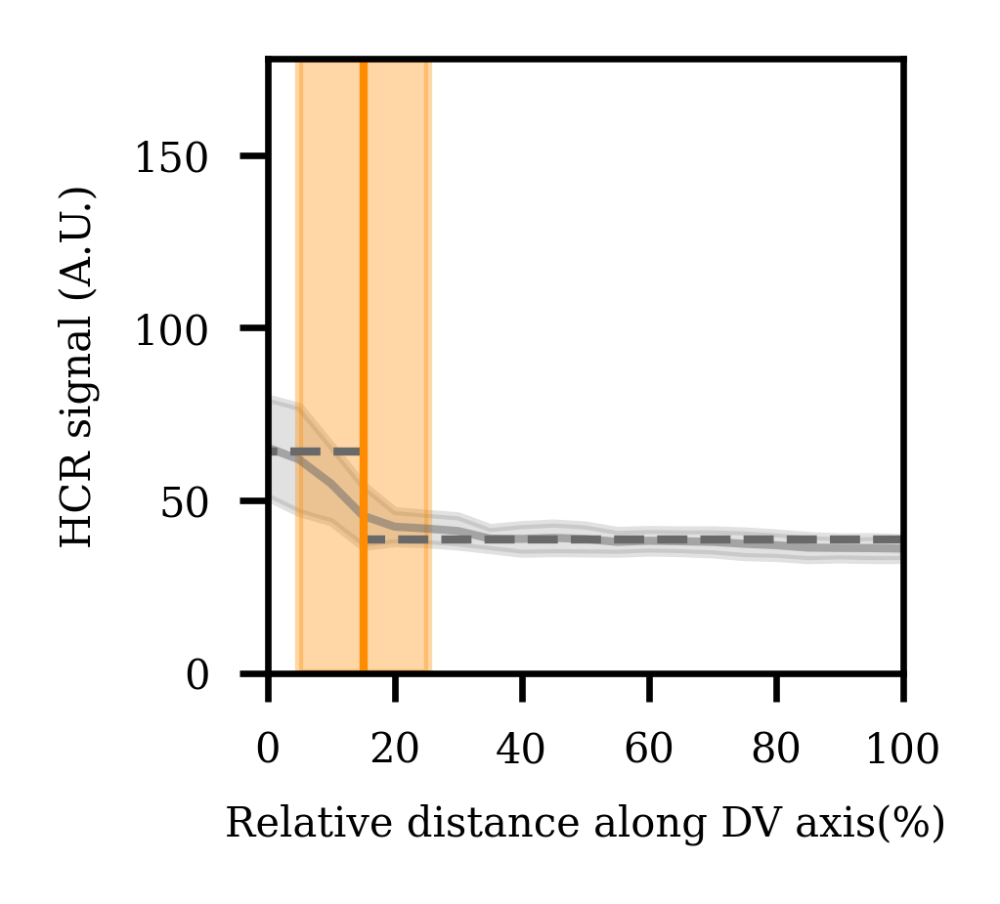

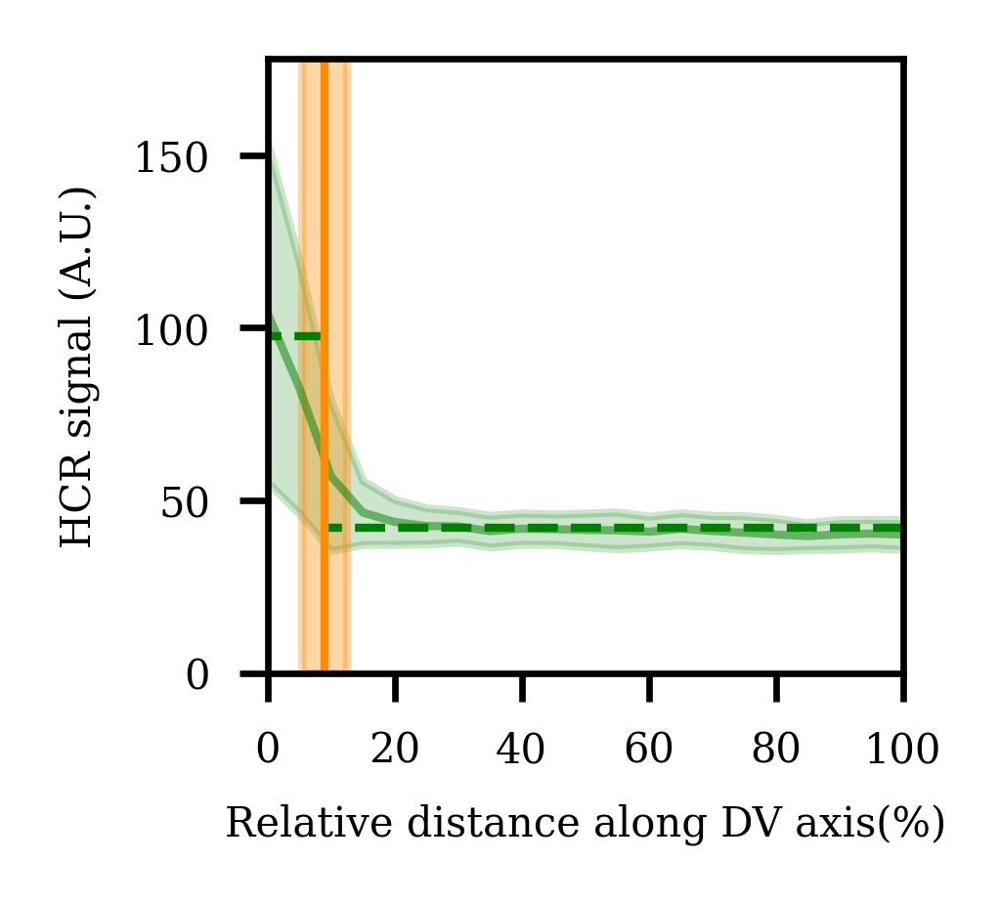

In [25]:
for gene, conditions in sorted_gene_stats.items():

    if gene in ["Sox2", "Pax6"]:
        continue        
        
    # Determine the ylim for both conditions
    all_mean = []
    all_std = []
    
    for condition, stats_df in conditions.items():
        y_data = stats_df['mean']
        all_mean.extend(y_data)

        y_std = stats_df['std']
        all_std.extend(y_std)

    ymax = np.max(all_mean)+1.5* np.max(all_std)
    ymin = 0
    
    for condition, stats_df in conditions.items():
        
        plt.figure(figsize=(1.6, 1.5), dpi=600)
        # plt.title(f'Expression zone for {gene} - {condition}')
        plt.xlabel("Relative distance along DV axis(%)")
        plt.ylabel("HCR signal (A.U.)")

        color = colors.get(condition, 'gray')
            
        # Extract data points
        x_data = stats_df['Distance'].astype(int)
        y_data = stats_df['mean']
        y_errors = stats_df['std']

        # Plotting the mean data and standard deviation area
        plt.plot(x_data, y_data, label=f'Experimental mean', color=color, alpha=0.5, linewidth=1)
        plt.fill_between(x_data, y_data - y_errors, y_data + y_errors, color=color, alpha=0.2, label=f'Experimental std')

        # Generate x values for plotting
        x_fit = np.linspace(0, 100, 300)  # Adjust range as necessary

        # Inflection points and their uncertainties
        condition_data = fit_results_two_steps[gene][condition]
        mean_fit_switchpoint = condition_data["mean_fit_switchpoint"]
        std_fit_switchpoint = condition_data["std_fit_switchpoint"]
        mean_fit_a = condition_data["mean_fit_a"]
        mean_fit_b = condition_data["mean_fit_b"]
        
        zone_color = "darkorange"
        line_type = "solid"


        # Intensities
        plt.plot([0, mean_fit_switchpoint], [mean_fit_a, mean_fit_a], color=color, linestyle='--', linewidth=1, label=rf'Model mean intensity')
        plt.plot([mean_fit_switchpoint, 100], [mean_fit_b, mean_fit_b], color=color, linestyle='--', linewidth=1)

        plt.axvline(x=mean_fit_switchpoint, color=zone_color, linewidth=1, linestyle=line_type, label=rf'Model mean switchpoint')
        plt.axvspan(xmin=mean_fit_switchpoint-std_fit_switchpoint, xmax=mean_fit_switchpoint+std_fit_switchpoint, color=zone_color, label=rf'Model mean switchpoint $\pm$ std', alpha=0.35)

        plt.ylim(ymin, ymax)  
        # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
        plt.tight_layout()
        plt.xlim(0,100)
        plt.gca().invert_xaxis()
        ax = plt.gca()
        set_inverted_xticks(ax)  # Set custom inverted x-tick labels
        plt.savefig(f'mean_fits_with_data/mean_fits_with_data-{gene}-{condition}.png', dpi=600, bbox_inches='tight')  # Save the figure for each condition        
        plt.show()
    print("\n\n")

## Differences between conditions

In [26]:
# Prepare the DataFrame for plotting
data = {
    'Gene': [],
    'Condition': [],
    'Replica': [],
    'Intensity': [],
    'Size':[]
}

box_colors = {'homeostatic': 'gray', 'blastema': 'green'}

for gene, conditions in fit_stats_two_steps.items():
    for condition, replicas in conditions.items():
        for replica, each_stats in replicas.items():
            data['Gene'].append(gene)
            data['Condition'].append(condition)
            data['Replica'].append(replica)
            if gene in ['Shh', 'Nkx6.1']:
                data['Intensity'].append(each_stats['best_a']-each_stats['best_b'])
            else:
                data['Intensity'].append(each_stats['best_b']-each_stats['best_a'])
            if gene in ['Shh', 'Nkx6.1']:
                data['Size'].append(each_stats['best_switchpoint'])
            else:
                data['Size'].append(100-each_stats['best_switchpoint'])

df_two_steps = pd.DataFrame(data)

In [27]:
# Remove "Pax6" Gene from df_two_steps
df_two_steps = df_two_steps[df_two_steps['Gene'] != 'Pax6']

# Append "Pax6" data from df_three_steps to df_two_steps
df_two_steps = pd.concat([df_two_steps, df_three_steps[df_three_steps['Gene'] == 'Pax6']], ignore_index=True)

# Removing any existing 'Pax6' rows from df_two_steps
df_two_steps = df_two_steps[df_two_steps['Gene'] != 'Pax6']

# Adding the rows from df_three_steps to df_two_steps
df_piecewise = pd.concat([df_two_steps, df_three_steps], ignore_index=True)

# Ensure the condition order is "homeostatic" first, and "blastema" second
condition_order = ['homeostatic', 'blastema']
df_piecewise['Condition'] = pd.Categorical(df_piecewise['Condition'], categories=condition_order, ordered=True)

# Ensure the combined dataframe is ordered by the specified gene order
gene_order = ['Msx1', 'Pax7', 'Pax6', 'Nkx6.1', 'Shh']
df_piecewise['Gene'] = pd.Categorical(df_piecewise['Gene'], categories=gene_order, ordered=True)

# Sort the dataframe by Gene and Condition
df_piecewise.sort_values(['Gene', 'Condition'], inplace=True)

# Reset the index to keep the dataframe clean
df_piecewise.reset_index(drop=True, inplace=True)

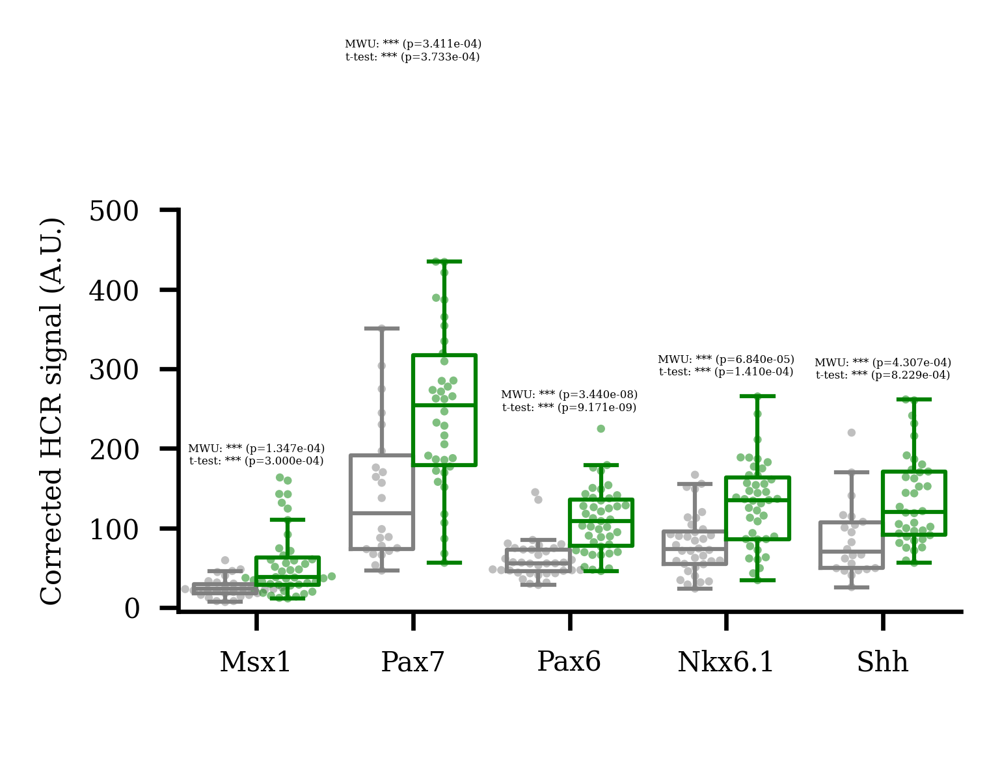

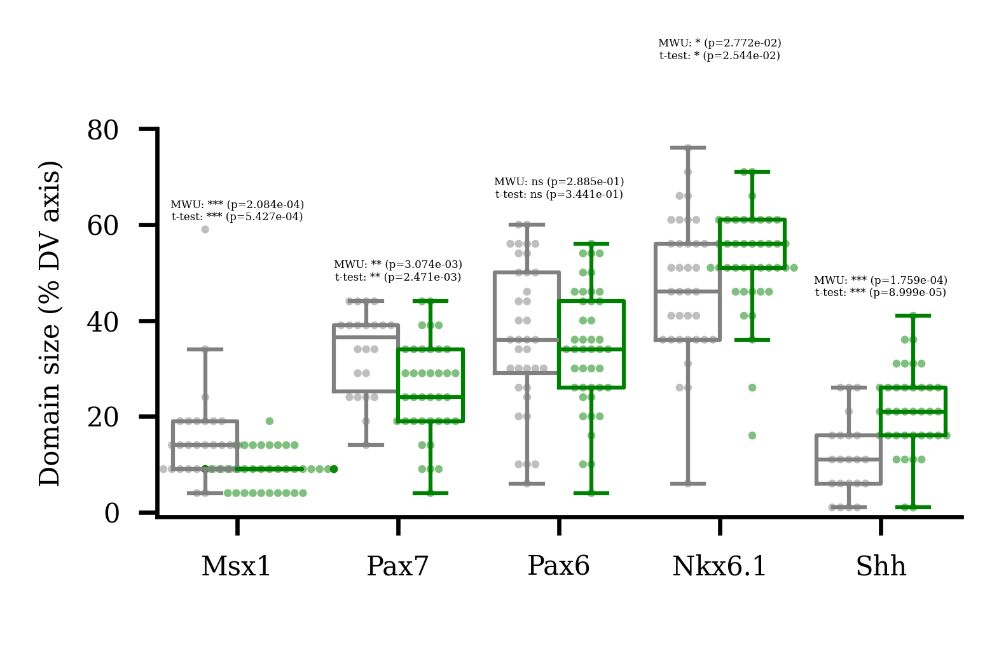

In [28]:
# Create the boxplot
plt.figure(figsize=(2.57, 1.57), dpi=600)
ax = sns.swarmplot(x='Gene', y='Intensity', hue='Condition', data=df_piecewise, palette=box_colors, linewidth=0, zorder=0, alpha=0.5, size=1.5, edgecolor="white", dodge=True)
ax = sns.boxplot(x='Gene', y='Intensity', hue='Condition', data=df_piecewise, palette=box_colors, linewidth=0.75, fill=False, showfliers=False, flierprops=dict(markerfacecolor="white", marker="d"), zorder=1)

# Function to add statistical annotations
def add_stat_annotation(ax, data, x, y, hue, box_pairs, tests=['Mann-Whitney', 't-test']):
    for pair in box_pairs:
        group1, group2 = pair
        data1 = data[(data[x] == group1[0]) & (data[hue] == group1[1])][y]
        data2 = data[(data[x] == group2[0]) & (data[hue] == group2[1])][y]
        
        annotations = []
        
        if 'Mann-Whitney' in tests:
            stat, p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
            significance = 'ns' if p_value > 0.05 else ('*' if p_value > 0.01 else ('**' if p_value > 0.001 else '***'))
            annotations.append(f'MWU: {significance} (p={p_value:.3e})')
        
        if 't-test' in tests:
            stat, p_value = stats.ttest_ind(data1, data2, alternative='two-sided', equal_var=True)
            significance = 'ns' if p_value > 0.05 else ('*' if p_value > 0.01 else ('**' if p_value > 0.001 else '***'))
            annotations.append(f't-test: {significance} (p={p_value:.3e})')
        
        annotation_text = '\n'.join(annotations)
        ax.text(x=group1[0], y=max(data1.max(), data2.max()) + data2.max()*0.1, s=annotation_text, ha='center', fontsize=2)

# Add statistical annotations
box_pairs = [(("Shh", "homeostatic"), ("Shh", "blastema")),
             (("Nkx6.1", "homeostatic"), ("Nkx6.1", "blastema")),
             (("Pax6", "homeostatic"), ("Pax6", "blastema")),
             (("Pax7", "homeostatic"), ("Pax7", "blastema")),
             (("Msx1", "homeostatic"), ("Msx1", "blastema"))]

add_stat_annotation(ax, data=df_piecewise, x='Gene', y='Intensity', hue='Condition', box_pairs=box_pairs)
# Remove duplicate legends and convert labels to title case
handles, labels = ax.get_legend_handles_labels()
unique_handles_labels = dict(zip(labels, handles))
labels = [label.title() for label in unique_handles_labels.keys()]
handles = unique_handles_labels.values()

# Customizing the plot
plt.xlabel(' ')
plt.ylabel("Corrected HCR signal (A.U.)")

# Improve layout
plt.legend([],[], frameon=False)
sns.despine()
plt.tight_layout()
plt.ylim(-5,500)
plt.savefig(f'conditions_comparison/piecewise_expression_level_comparison.png', dpi=600)  # Save the figure for each condition
plt.show()

# Create the boxplot
plt.figure(figsize=(2.57, 1.57), dpi=600)
ax = sns.swarmplot(x='Gene', y='Size', hue='Condition', data=df_piecewise, palette=box_colors, linewidth=0, zorder=0, alpha=0.5, size=1.5, edgecolor="white", dodge=True)
ax = sns.boxplot(x='Gene', y='Size', hue='Condition', data=df_piecewise, palette=box_colors, linewidth=0.75, fill=False, showfliers=False, flierprops=dict(markerfacecolor="white", marker="d"), zorder=1)
add_stat_annotation(ax, data=df_piecewise, x='Gene', y='Size', hue='Condition', box_pairs=box_pairs)

# Remove duplicate legends and convert labels to title case
handles, labels = ax.get_legend_handles_labels()
unique_handles_labels = dict(zip(labels, handles))
labels = [label.title() for label in unique_handles_labels.keys()]
handles = unique_handles_labels.values()

# Customizing the plot
plt.xlabel(' ')
plt.ylabel(r"Domain size (% DV axis)")

# Improve layout
plt.legend([],[], frameon=False)
sns.despine()
plt.tight_layout()
plt.ylim(-1,80)
plt.savefig(f'conditions_comparison/piecewise_domain_size_comparison.png', dpi=600)  # Save the figure for each condition
plt.show()

# Summary statistics for gene expression data

In [29]:
# Prepare piecewise df
df_piecewise_new = df_piecewise.drop(["Replica"], axis=1)

# Concat dfs
df_models_results = df_piecewise_new

# Group by Gene, Condition, and Model, and then aggregate the mean, median, and std
summary_stats = df_models_results.groupby(['Gene', 'Condition']).agg({
    'Intensity': ['mean', 'median', 'std'],
    'Size': ['mean', 'median', 'std']
}).reset_index()

# Define the custom order for the 'Gene' and 'Model' columns
gene_order = ['Shh', 'Nkx6.1', 'Pax6', 'Pax7', 'Msx1', 'Sox2']
summary_stats['Gene'] = pd.Categorical(summary_stats['Gene'], categories=gene_order, ordered=True)

# Sort by Model first, then Gene, and then Condition
summary_stats = summary_stats.sort_values(by=['Gene', 'Condition']).reset_index(drop=True)

# Save to CSV
summary_stats.to_csv('summary_stats.csv', index=False)

# Display the summary statistics
summary_stats

Gene    Condition   Intensity                               Size         \
                              mean      median         std       mean median   
0     Shh  homeostatic   85.585794   70.182582   46.826542  11.454545   11.0   
1     Shh     blastema  135.779075  120.428422   56.329143  21.131579   21.0   
2  Nkx6.1  homeostatic   79.821257   73.498657   37.026403  47.111111   46.0   
3  Nkx6.1     blastema  126.508567  135.176128   61.115306  53.906977   56.0   
4    Pax6  homeostatic   60.382351   55.721810   24.810871  36.944444   36.0   
5    Pax6     blastema  109.752761  108.819356   39.940909  33.953488   34.0   
6    Pax7  homeostatic  146.049853  118.298134   88.705139  33.545455   36.5   
7    Pax7     blastema  255.332911  254.370189  117.456285  25.447368   24.0   
8    Msx1  homeostatic   25.455931   23.471958   12.372951  15.166667   14.0   
9    Msx1     blastema   55.528423   38.422464   41.983460   9.000000    9.0   

              
         std  
0   8.151700  
1   8.813905  
2  14.348276  
3  12.161246  
4  15.295087  
5  12.637724  
6   8.851835  
7   9.925935  
8  10.312642  
9   3.618734